# dataset clean (1444) preprocessing densenet169 + optimasi hyperparameter

In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import random
import cv2
import shutil
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.applications.densenet import preprocess_input
from tensorflow.keras.models import load_model
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from tensorflow.keras.applications import DenseNet169
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Conv2D, MaxPooling2D, Dropout, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from PIL import Image
from tensorflow.keras.callbacks import ReduceLROnPlateau

In [2]:
# Lokasi dataset asli
base_dir = r'..\..\dataset\Dataset 1444'
train_dir = r'..\..\dataset\Batik Djawa\train'
test_dir = r'..\..\dataset\Batik Djawa\test'

# # Membuat folder untuk data train dan test jika belum ada
# os.makedirs(train_dir, exist_ok=True)
# os.makedirs(test_dir, exist_ok=True)

# # Mendapatkan daftar kelas (subfolder dalam dataset)
# classes = [d for d in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, d))]

# # Membagi data per kelas
# for cls in classes:
#     cls_path = os.path.join(base_dir, cls)

#     # Membuat folder kelas di train dan test
#     os.makedirs(os.path.join(train_dir, cls), exist_ok=True)
#     os.makedirs(os.path.join(test_dir, cls), exist_ok=True)

#     # Mendapatkan daftar file gambar dalam kelas
#     images = os.listdir(cls_path)

#     # Membagi gambar menjadi 80% train dan 20% test
#     train_imgs, test_imgs = train_test_split(images, test_size=0.2, random_state=42)

#     # Memindahkan file ke folder train dan test
#     for img in train_imgs:
#         shutil.move(os.path.join(cls_path, img), os.path.join(train_dir, cls, img))
#     for img in test_imgs:
#         shutil.move(os.path.join(cls_path, img), os.path.join(test_dir, cls, img))

# print("Pembagian dataset selesai.")

Jumlah data Kawung: 288
Jumlah data Mega Mendung: 288
Jumlah data Parang: 288
Jumlah data Truntum: 288
Jumlah Dataset : 1152


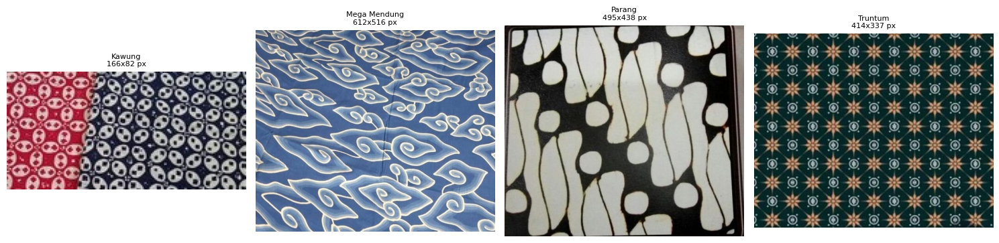

In [5]:
# ## Menampilkan Jumlah Dataset dari setiap kelas
total_dataset = 0
# dataset_dir = r'..\dataset\Dataset Batik Jawa'
folders = [folder for folder in os.listdir(train_dir) if os.path.isdir(os.path.join(train_dir, folder))]
fig, axes = plt.subplots(1, len(folders), figsize=(15, 5))  # Mengatur jumlah kolom berdasarkan jumlah folder

for i, folder in enumerate(folders):
    folder_path = os.path.join(train_dir, folder)
    image_count = len(os.listdir(folder_path))
    total_dataset += image_count
    print(f"Jumlah data {folder}: {image_count}")

    # Menampilkan foto secara acak dari setiap folder
    try:
        image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]
        if image_files:
            random_image = random.choice(image_files)
            image_path = os.path.join(folder_path, random_image)
            img = Image.open(image_path)
            width, height = img.size

            # Menampilkan gambar di subplot horizontal
            axes[i].imshow(img)
            axes[i].set_title(f"{folder}\n{width}x{height} px", fontsize=8)
            axes[i].axis('off')
        else:
            print(f"Tidak ada gambar yang ditemukan di folder '{folder}'")
    except Exception as e:
        print(f"Error menampilkan gambar dari folder '{folder}': {e}")


print(f"Jumlah Dataset : {total_dataset}")
plt.tight_layout()
plt.show()

### dataset Stephanie anastasia

Jumlah data Insang: 138
Jumlah data Kawung: 249
Jumlah data Mega mendung: 219
Jumlah data Parang: 238
Jumlah data Sidoluhur: 102
Jumlah data Truntum: 201
Jumlah data Tumpal: 107
Jumlah Dataset : 1254


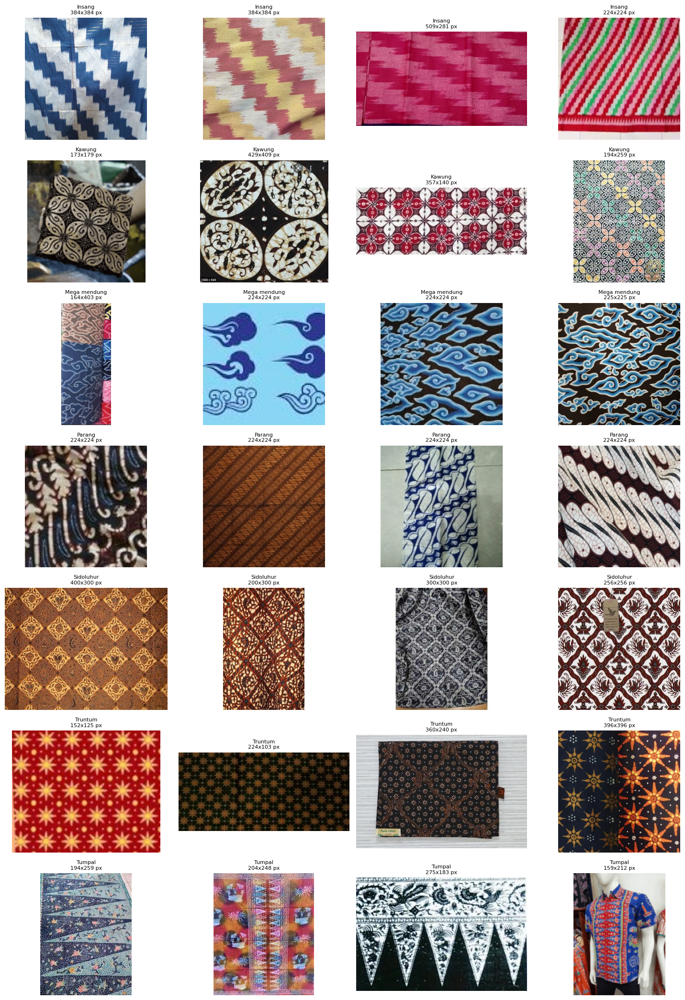

In [16]:
stephanie_data = r'..\..\dataset\Syahdan Putra\batikimages'
total_dataset = 0
folders = [folder for folder in os.listdir(stephanie_data) if os.path.isdir(os.path.join(stephanie_data, folder))]

# Tentukan jumlah baris (kelas) dan jumlah gambar per baris
num_rows = len(folders)  # 4 kelas (Kawung, Mega Mendung, Parang, Truntum)
num_cols = 4  # 4 gambar per kelas

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 3))  # Atur ukuran subplot

for row, folder in enumerate(folders):
    folder_path = os.path.join(stephanie_data, folder)
    image_count = len(os.listdir(folder_path))
    total_dataset += image_count
    print(f"Jumlah data {folder}: {image_count}")
    
    # Ambil semua gambar dalam folder
    image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]
    
    # Pastikan ada cukup gambar untuk ditampilkan
    if len(image_files) < num_cols:
        print(f"Peringatan: Folder '{folder}' memiliki kurang dari {num_cols} gambar!")

    # Pilih secara acak `num_cols` gambar untuk setiap kelas
    selected_images = random.sample(image_files, min(num_cols, len(image_files)))

    for col, image_name in enumerate(selected_images):
        image_path = os.path.join(folder_path, image_name)
        img = Image.open(image_path)
        width, height = img.size
        
        # Menampilkan gambar
        axes[row, col].imshow(img)
        axes[row, col].set_title(f"{folder}\n{width}x{height} px", fontsize=8)
        axes[row, col].axis('off')    

print(f"Jumlah Dataset : {total_dataset}")

# Menampilkan hasil
plt.tight_layout()
plt.show()

Jumlah data Kawung: 73
Jumlah data Mega Mendung: 73
Jumlah data Parang: 73
Jumlah data Truntum: 73
Jumlah Dataset : 292


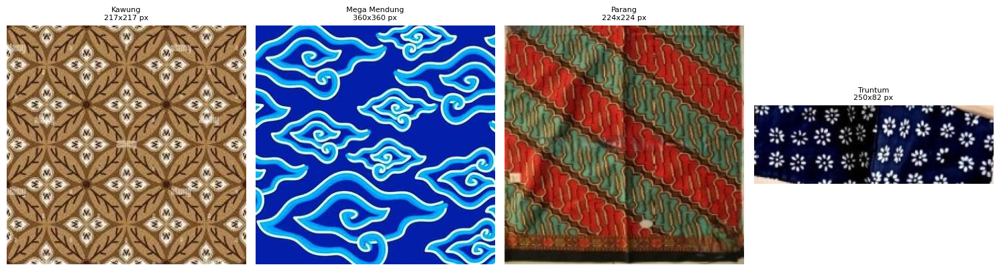

In [6]:
# ## Menampilkan Jumlah Dataset dari setiap kelas
total_dataset = 0
# dataset_dir = r'..\dataset\Dataset Batik Jawa'
folders = [folder for folder in os.listdir(test_dir) if os.path.isdir(os.path.join(test_dir, folder))]
fig, axes = plt.subplots(1, len(folders), figsize=(15, 5))  # Mengatur jumlah kolom berdasarkan jumlah folder

for i, folder in enumerate(folders):
    folder_path = os.path.join(test_dir, folder)
    image_count = len(os.listdir(folder_path))
    total_dataset += image_count
    print(f"Jumlah data {folder}: {image_count}")

    # Menampilkan foto secara acak dari setiap folder
    try:
        image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]
        if image_files:
            random_image = random.choice(image_files)
            image_path = os.path.join(folder_path, random_image)
            img = Image.open(image_path)
            width, height = img.size

            # Menampilkan gambar di subplot horizontal
            axes[i].imshow(img)
            axes[i].set_title(f"{folder}\n{width}x{height} px", fontsize=8)
            axes[i].axis('off')
        else:
            print(f"Tidak ada gambar yang ditemukan di folder '{folder}'")
    except Exception as e:
        print(f"Error menampilkan gambar dari folder '{folder}': {e}")


print(f"Jumlah Dataset : {total_dataset}")
plt.tight_layout()
plt.show()

# Batch Size

In [6]:
IMAGE_WIDTH = 224
IMAGE_HEIGHT = 224
IMAGE_SIZE = (IMAGE_WIDTH, IMAGE_HEIGHT)
BATCH_SIZE = 32
COLOR_CHANNELS = 3

In [7]:
# Ambil semua file gambar dari dataset asli
file_paths = []
labels = []

# Ambil file dari train_dir (data asli)
for label in os.listdir(train_dir):
    label_path = os.path.join(train_dir, label)
    if os.path.isdir(label_path):
        for file in os.listdir(label_path):
            file_paths.append(os.path.join(label_path, file))
            labels.append(label)

# Map label ke integer
unique_labels = sorted(set(labels))
label_map = {label: idx for idx, label in enumerate(unique_labels)}
integer_labels = [label_map[label] for label in labels]

print(f"Jumlah total gambar: {len(file_paths)}")
print(len(unique_labels))
print(label_map)
print(integer_labels)

Jumlah total gambar: 1152
4
{'Kawung': 0, 'Mega Mendung': 1, 'Parang': 2, 'Truntum': 3}
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

# KFold Model P1

In [8]:
datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
    )

test_generator = datagen.flow_from_directory(
    directory=test_dir,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    color_mode='rgb',
    shuffle=False
)

Found 292 images belonging to 4 classes.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].


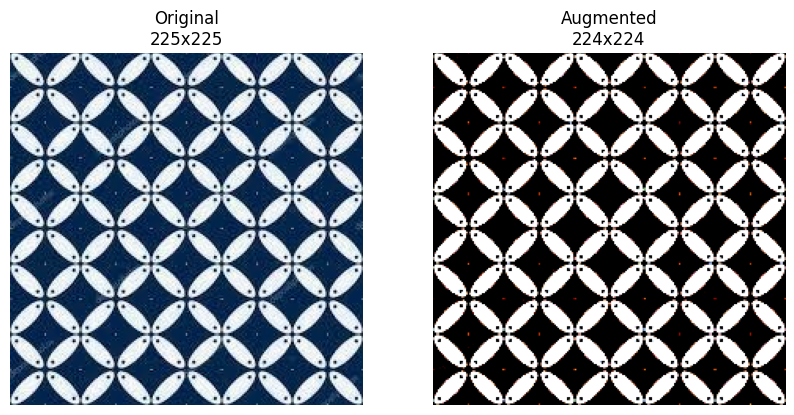

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.2009804].


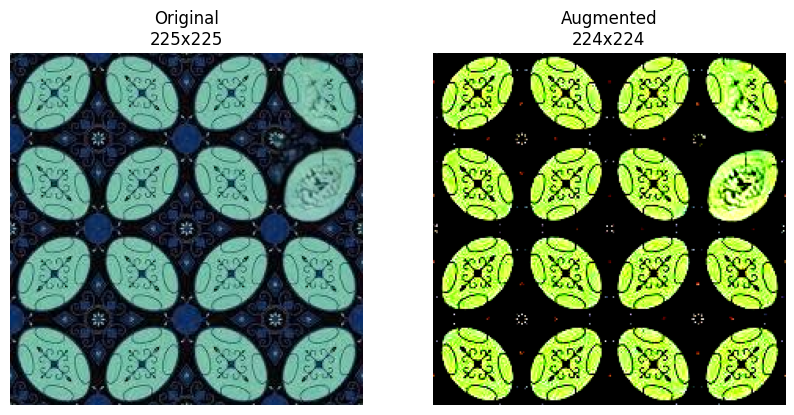

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0357141..2.2489083].


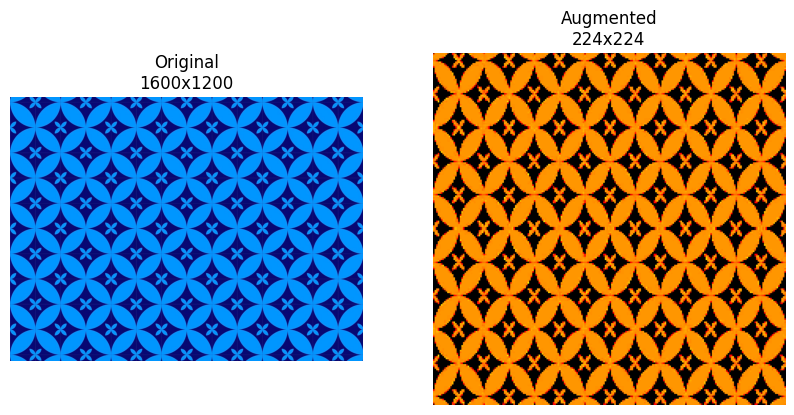

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].


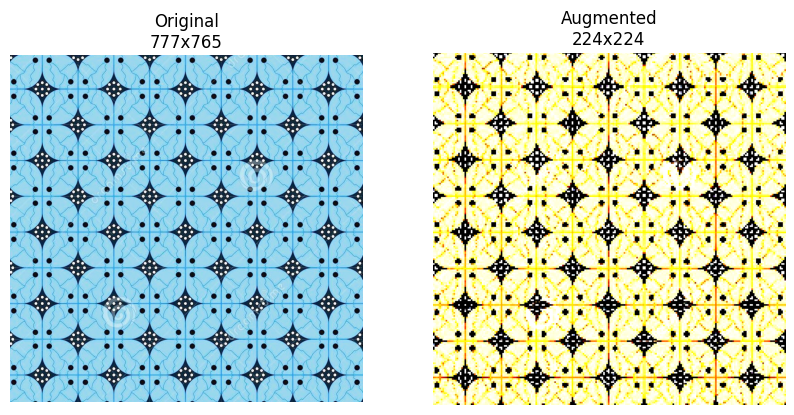

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.5185376..2.169412].


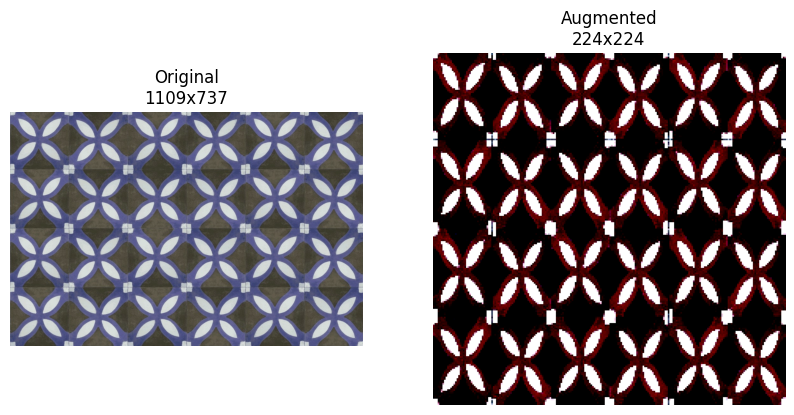

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.2787911..2.343704].


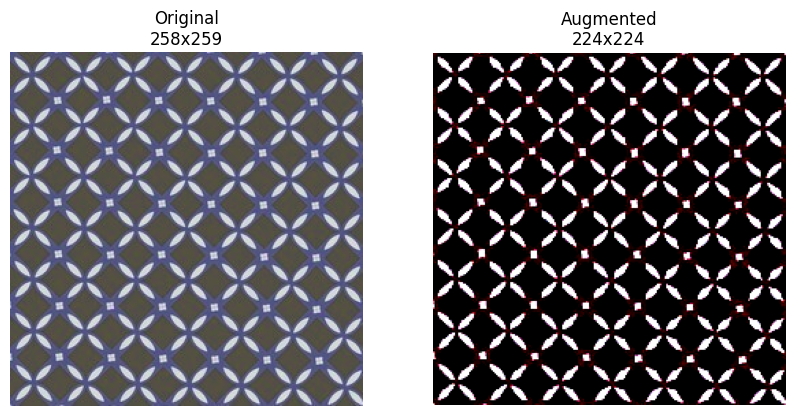

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9831933..1.5125438].


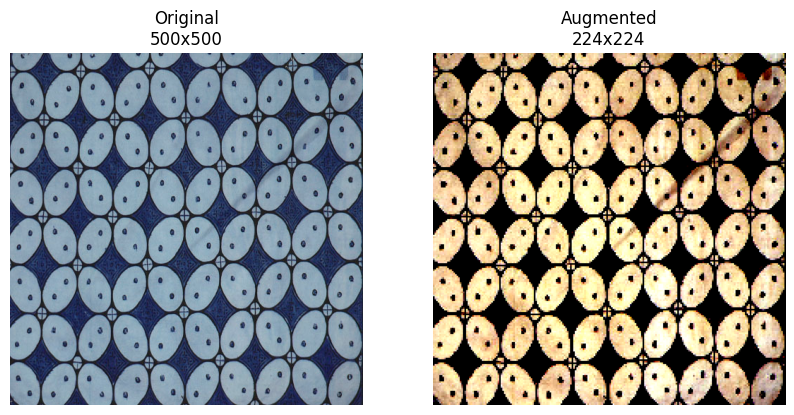

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0494049..2.64].


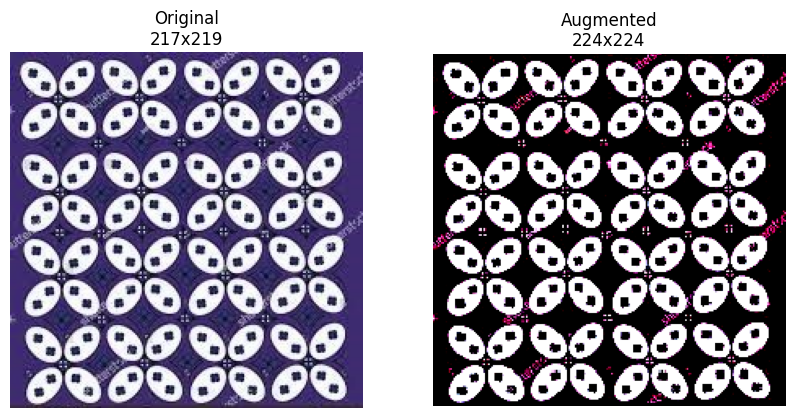

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.169412].


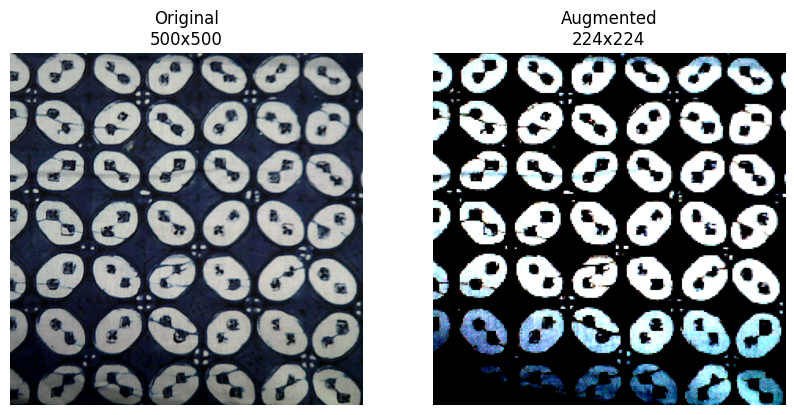

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.64].


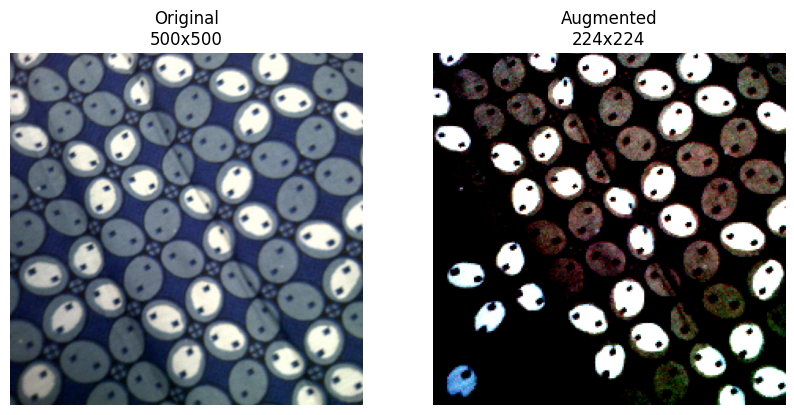

In [7]:
# Get a batch of images from the test generator
images, labels = next(test_generator)

for i in range(len(test_generator)):
    # Original image (assuming images are loaded with cv2)
    img_path = test_generator.filepaths[test_generator.index_array[i]]
    original_image = cv2.imread(img_path)
    
    # Augmented image from the test generator
    augmented_image = images[i]

    # Get image dimensions
    height_original, width_original, _ = original_image.shape
    height_augmented, width_augmented, _ = augmented_image.shape

    # Display the images
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(original_image)
    axes[0].set_title(f"Original\n{width_original}x{height_original}")
    axes[0].axis("off")

    axes[1].imshow(augmented_image)
    axes[1].set_title(f"Augmented\n{width_augmented}x{height_augmented}")
    axes[1].axis("off")
    plt.show()


🚀 Training Fold 1 😌

Found 921 validated image filenames belonging to 4 classes.
Found 231 validated image filenames belonging to 4 classes.


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 111s 3s/step - accuracy: 0.4260 - loss: 1.4653 - val_accuracy: 0.8312 - val_loss: 0.6637 - learning_rate: 1.0000e-04
Epoch 2/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 88s 3s/step - accuracy: 0.6299 - loss: 0.8597 - val_accuracy: 0.8788 - val_loss: 0.4284 - learning_rate: 1.0000e-04
Epoch 3/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 88s 3s/step - accuracy: 0.7922 - loss: 0.5450 - val_accuracy: 0.9177 - val_loss: 0.2273 - learning_rate: 1.0000e-04
Epoch 4/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 87s 3s/step - accuracy: 0.8459 - loss: 0.4229 - val_accuracy: 0.9307 - val_loss: 0.1889 - learning_rate: 1.0000e-04
Epoch 5/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 95s 3s/step - accuracy: 0.8904 - loss: 0.3283 - val_accuracy: 0.9394 - val_loss: 0.1690 - learning_rate: 1.0000e-04
Epoch 6/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 86s 3s/step - accuracy: 0.9054 - loss: 0.2677 - val_accuracy: 0.9221 - val_loss: 0.1877 - learning_rate: 1.0000e-04
Epoch 7/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 89s 3s/step - accuracy: 0.9127 - loss

C:\Users\ASUS\AppData\Local\Temp\ipykernel_18204\3099694086.py:122: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
C:\Users\ASUS\AppData\Local\Temp\ipykernel_18204\3099694086.py:131: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,


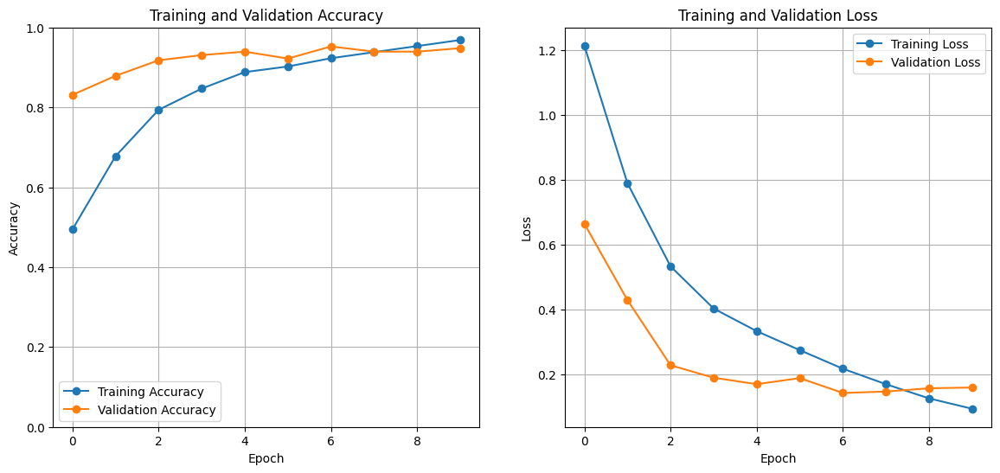

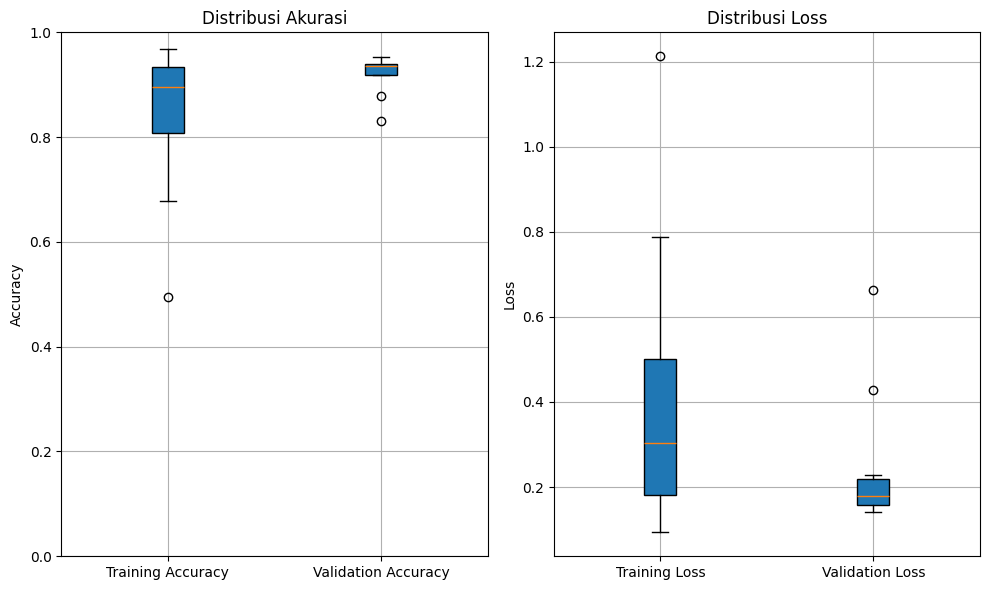


🚀 Training Fold 2 😌

Found 921 validated image filenames belonging to 4 classes.
Found 231 validated image filenames belonging to 4 classes.


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 124s 4s/step - accuracy: 0.3531 - loss: 1.5132 - val_accuracy: 0.7835 - val_loss: 0.7534 - learning_rate: 1.0000e-04
Epoch 2/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 98s 3s/step - accuracy: 0.6011 - loss: 0.9677 - val_accuracy: 0.8918 - val_loss: 0.4361 - learning_rate: 1.0000e-04
Epoch 3/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 100s 3s/step - accuracy: 0.7525 - loss: 0.6596 - val_accuracy: 0.8961 - val_loss: 0.3283 - learning_rate: 1.0000e-04
Epoch 4/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 95s 3s/step - accuracy: 0.8059 - loss: 0.5049 - val_accuracy: 0.9351 - val_loss: 0.2335 - learning_rate: 1.0000e-04
Epoch 5/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 86s 3s/step - accuracy: 0.8641 - loss: 0.3658 - val_accuracy: 0.9437 - val_loss: 0.1876 - learning_rate: 1.0000e-04
Epoch 6/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 86s 3s/step - accuracy: 0.8828 - loss: 0.3142 - val_accuracy: 0.9394 - val_loss: 0.1855 - learning_rate: 1.0000e-04
Epoch 7/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 86s 3s/step - accuracy: 0.9174 - los

C:\Users\ASUS\AppData\Local\Temp\ipykernel_18204\3099694086.py:122: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
C:\Users\ASUS\AppData\Local\Temp\ipykernel_18204\3099694086.py:131: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,


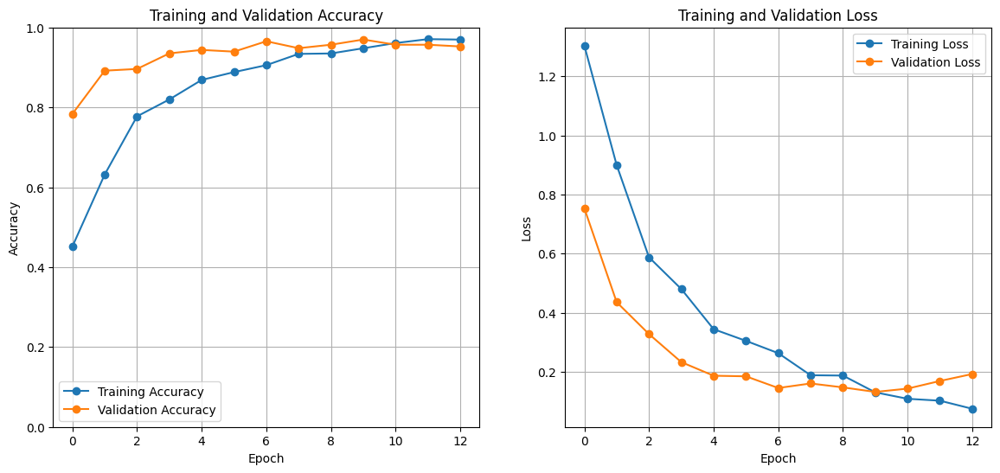

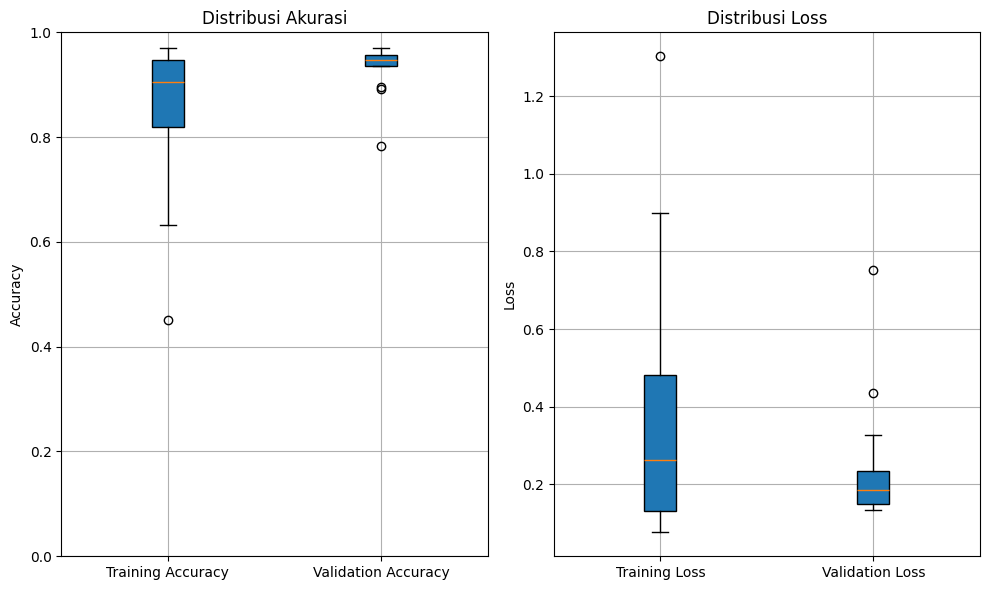


🚀 Training Fold 3 😌

Found 922 validated image filenames belonging to 4 classes.
Found 230 validated image filenames belonging to 4 classes.


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 123s 4s/step - accuracy: 0.4111 - loss: 1.4845 - val_accuracy: 0.8000 - val_loss: 0.6470 - learning_rate: 1.0000e-04
Epoch 2/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 89s 3s/step - accuracy: 0.6822 - loss: 0.7755 - val_accuracy: 0.8478 - val_loss: 0.4763 - learning_rate: 1.0000e-04
Epoch 3/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 89s 3s/step - accuracy: 0.7812 - loss: 0.5854 - val_accuracy: 0.8609 - val_loss: 0.3936 - learning_rate: 1.0000e-04
Epoch 4/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 88s 3s/step - accuracy: 0.8460 - loss: 0.4120 - val_accuracy: 0.8826 - val_loss: 0.3019 - learning_rate: 1.0000e-04
Epoch 5/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 81s 3s/step - accuracy: 0.8710 - loss: 0.3794 - val_accuracy: 0.9000 - val_loss: 0.2498 - learning_rate: 1.0000e-04
Epoch 6/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 85s 3s/step - accuracy: 0.8947 - loss: 0.2728 - val_accuracy: 0.9174 - val_loss: 0.2339 - learning_rate: 1.0000e-04
Epoch 7/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 88s 3s/step - accuracy: 0.9089 - loss

C:\Users\ASUS\AppData\Local\Temp\ipykernel_18204\3099694086.py:122: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
C:\Users\ASUS\AppData\Local\Temp\ipykernel_18204\3099694086.py:131: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,


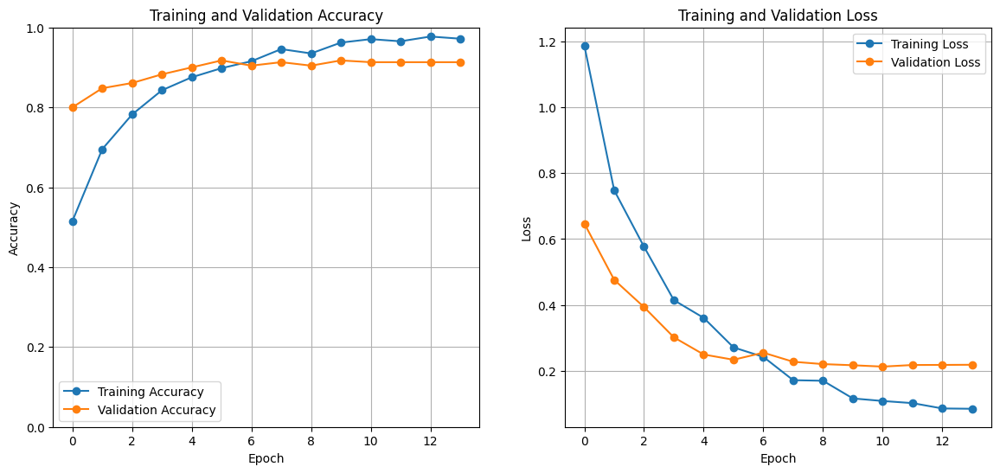

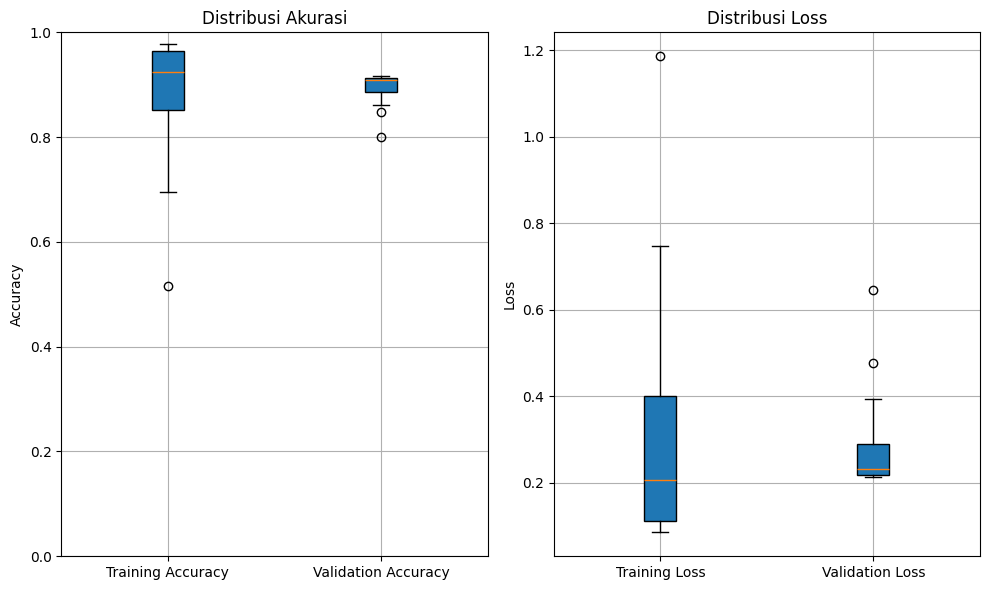


🚀 Training Fold 4 😌

Found 922 validated image filenames belonging to 4 classes.
Found 230 validated image filenames belonging to 4 classes.


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 107s 3s/step - accuracy: 0.3581 - loss: 1.6131 - val_accuracy: 0.8435 - val_loss: 0.7148 - learning_rate: 1.0000e-04
Epoch 2/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 85s 3s/step - accuracy: 0.6233 - loss: 0.8682 - val_accuracy: 0.9130 - val_loss: 0.4462 - learning_rate: 1.0000e-04
Epoch 3/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 82s 3s/step - accuracy: 0.7430 - loss: 0.6539 - val_accuracy: 0.9087 - val_loss: 0.3205 - learning_rate: 1.0000e-04
Epoch 4/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 80s 3s/step - accuracy: 0.7934 - loss: 0.5461 - val_accuracy: 0.9348 - val_loss: 0.2539 - learning_rate: 1.0000e-04
Epoch 5/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 86s 3s/step - accuracy: 0.8217 - loss: 0.4732 - val_accuracy: 0.9304 - val_loss: 0.2234 - learning_rate: 1.0000e-04
Epoch 6/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 88s 3s/step - accuracy: 0.8901 - loss: 0.3163 - val_accuracy: 0.9217 - val_loss: 0.2042 - learning_rate: 1.0000e-04
Epoch 7/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8836 - loss:

C:\Users\ASUS\AppData\Local\Temp\ipykernel_18204\3099694086.py:122: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
C:\Users\ASUS\AppData\Local\Temp\ipykernel_18204\3099694086.py:131: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,


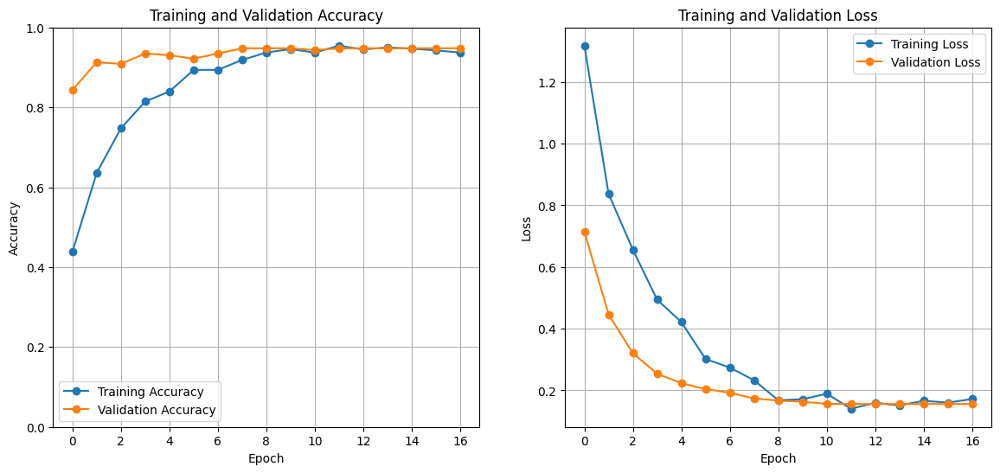

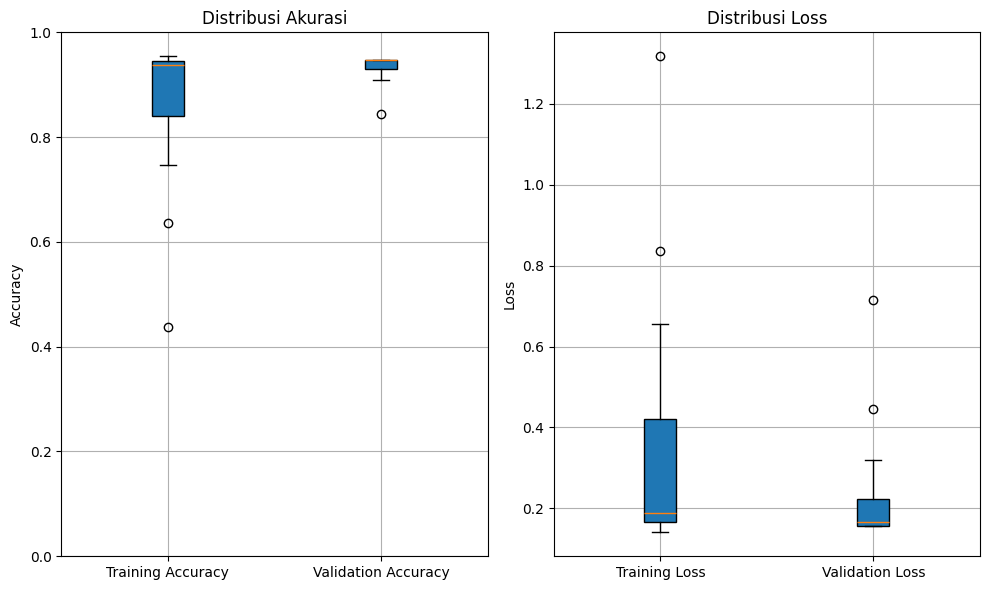


🚀 Training Fold 5 😌

Found 922 validated image filenames belonging to 4 classes.
Found 230 validated image filenames belonging to 4 classes.


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 115s 3s/step - accuracy: 0.3249 - loss: 1.5629 - val_accuracy: 0.8087 - val_loss: 0.8672 - learning_rate: 1.0000e-04
Epoch 2/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 86s 3s/step - accuracy: 0.5730 - loss: 0.9914 - val_accuracy: 0.9000 - val_loss: 0.5128 - learning_rate: 1.0000e-04
Epoch 3/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 87s 3s/step - accuracy: 0.6734 - loss: 0.7681 - val_accuracy: 0.9348 - val_loss: 0.3317 - learning_rate: 1.0000e-04
Epoch 4/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 94s 3s/step - accuracy: 0.7961 - loss: 0.5610 - val_accuracy: 0.9435 - val_loss: 0.2529 - learning_rate: 1.0000e-04
Epoch 5/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 83s 3s/step - accuracy: 0.8039 - loss: 0.4783 - val_accuracy: 0.9391 - val_loss: 0.2164 - learning_rate: 1.0000e-04
Epoch 6/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 83s 3s/step - accuracy: 0.8838 - loss: 0.3236 - val_accuracy: 0.9478 - val_loss: 0.1670 - learning_rate: 1.0000e-04
Epoch 7/20
29/29 ━━━━━━━━━━━━━━━━━━━━ 83s 3s/step - accuracy: 0.8927 - loss

C:\Users\ASUS\AppData\Local\Temp\ipykernel_18204\3099694086.py:122: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
C:\Users\ASUS\AppData\Local\Temp\ipykernel_18204\3099694086.py:131: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,


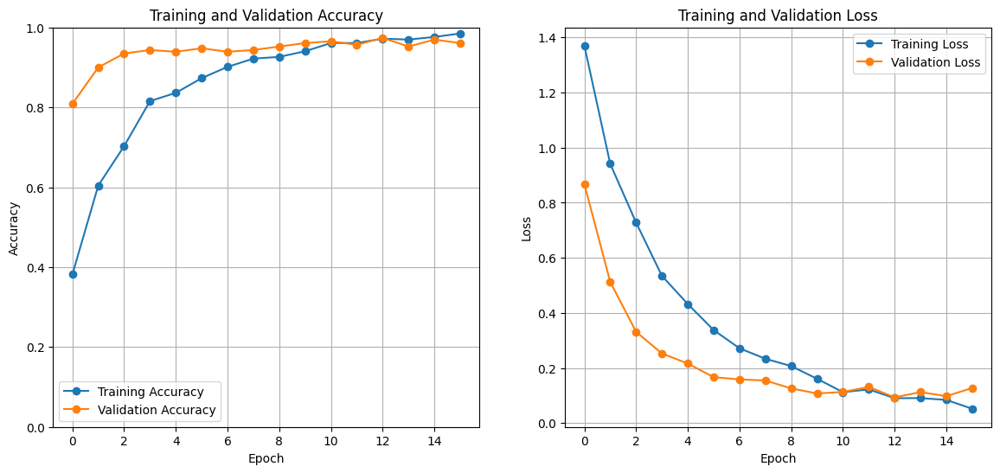

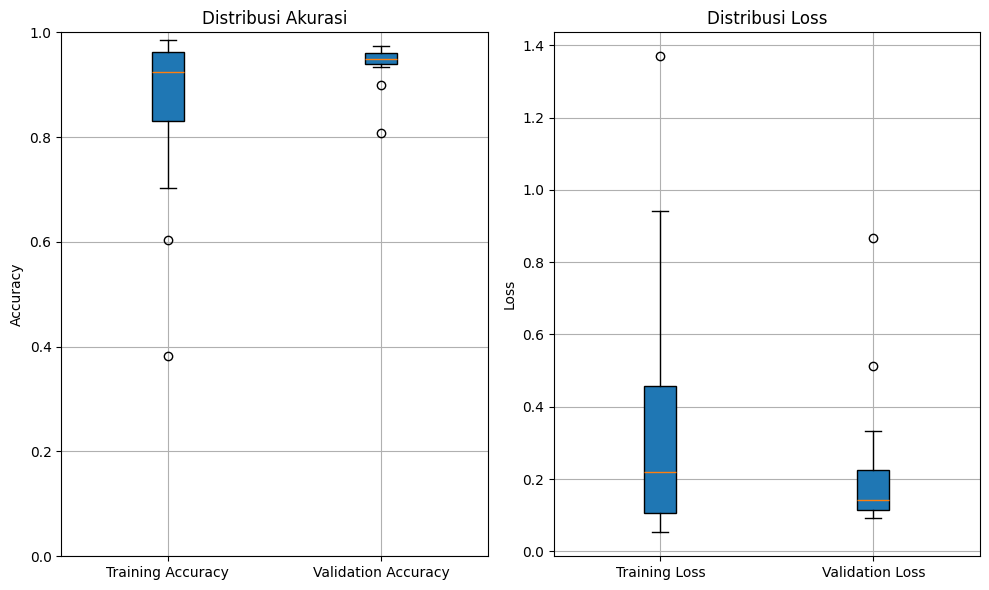

In [ ]:
# Tentukan jumlah fold
n_splits = 5
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

# Direktori untuk menyimpan model terbaik
best_model_dir = r'.\model P1'

# Fungsi untuk membuat model
def create_model(num_classes):
    base_model = DenseNet169(weights='imagenet', include_top=False, input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, COLOR_CHANNELS))

    for layer in base_model.layers[:-10]:  # Membekukan semua kecuali 10 lapisan terakhir
        layer.trainable = False

    x = base_model.output
    x = Conv2D(32, (4, 4), activation='relu')(x)
    x = MaxPooling2D((2, 2))(x)
    x = Dropout(0.3)(x)
    x = Dense(64, activation='relu', name='FC2')(x) 
    x = Dropout(0.3)(x)
    x = Flatten()(x)
    x = Dropout(0.3)(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer=RMSprop(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])
    
    # model.summary()
    return model

EPOCHS = 20 
fold_var = 1

# Looping untuk setiap fold
for train_index, val_index in kf.split(file_paths): # file_paths merupakan list dari semua path gambar
    print(f"\n🚀 Training Fold {fold_var} 😌\n")

    # Split train and validation sets
    train_files, val_files = np.array(file_paths)[train_index], np.array(file_paths)[val_index]
    train_labels, val_labels = np.array(integer_labels)[train_index], np.array(integer_labels)[val_index]
    
    # Convert integer labels to class names
    df_train = pd.DataFrame({"filename": train_files, "class": [unique_labels[i] for i in train_labels]})
    df_val = pd.DataFrame({"filename": val_files, "class": [unique_labels[i] for i in val_labels]})


    train_generator = datagen.flow_from_dataframe(
    dataframe=df_train,       # DataFrame yang berisi informasi gambar (filename dan class)
    x_col="filename",         # Kolom yang berisi path ke gambar
    y_col="class",            # Kolom yang berisi label kelas gambar
    target_size=IMAGE_SIZE,   # Ukuran gambar yang akan diubah sebelum masuk ke model
    batch_size=BATCH_SIZE,    # Jumlah gambar yang akan diproses dalam satu batch
    class_mode="categorical", # Mode klasifikasi (multikategori)
    color_mode="rgb",         # Format warna gambar (RGB)
    shuffle=True
    )
    
    val_generator = datagen.flow_from_dataframe(
        dataframe=df_val,
        x_col="filename",
        y_col="class",
        target_size=IMAGE_SIZE,
        batch_size=BATCH_SIZE,
        class_mode="categorical",
        color_mode="rgb",
        shuffle=True
    )

     # Callbacks
    early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1)
    model_checkpoint = ModelCheckpoint(os.path.join(best_model_dir, f'best_model_{fold_var}.keras'), monitor='val_loss', save_best_only=True)
    
    # Buat Learning Rate Scheduler
    lr_scheduler = ReduceLROnPlateau(
        monitor='val_accuracy',     
        factor=0.1,             
        patience=3,             # Jika val_loss tidak membaik setelah 3 epoch, LR akan diturunkan
        min_lr=1e-6,            
        verbose=1               
    )

    num_classes = len(label_map)
    model = create_model(num_classes) 

    # Training Model
    history = model.fit(
        train_generator,
        epochs=EPOCHS,
        validation_data=val_generator,
        callbacks=[early_stopping, model_checkpoint, lr_scheduler]
    )

    # Plot grafik akurasi dan loss dengan format yang lebih baik
    plt.figure(figsize=(14, 6))

    # Plot Training and Validation Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Training Accuracy', marker='o')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.ylim(0, 1)  # Menentukan rentang y antara 0 dan 1 (untuk akurasi)
    plt.grid(True)
    plt.legend()

    # Plot Training and Validation Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Training Loss', marker='o')
    plt.plot(history.history['val_loss'], label='Validation Loss', marker='o')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.grid(True)
    plt.legend()


    # Buat figure Box Plot
    plt.figure(figsize=(10, 6))
    
    # Boxplot untuk Training & Validation Accuracy
    plt.subplot(1, 2, 1)
    plt.boxplot([history.history['accuracy'], history.history['val_accuracy']], vert=True, patch_artist=True,
                labels=['Training Accuracy', 'Validation Accuracy'])
    plt.title('Distribusi Akurasi')
    plt.ylabel('Accuracy')
    plt.ylim(0, 1)
    plt.grid(True)
    
    # Boxplot untuk Training & Validation Loss
    plt.subplot(1, 2, 2)
    plt.boxplot([history.history['loss'], history.history['val_loss']], vert=True, patch_artist=True,
                labels=['Training Loss', 'Validation Loss'])
    plt.title('Distribusi Loss')
    plt.ylabel('Loss')
    plt.grid(True)

    # Tampilkan grafik
    plt.tight_layout()
    plt.show()

    # menambah fold
    fold_var += 1

In [6]:
import numpy as np

# Contoh hasil akurasi dari 5 fold
accuracies = [95.24, 96.97, 91.30, 94.78, 97.39]
# accuracies = [0.9579, 0.9689, 0.9798, 0.9670, 0.9670]

# Menghitung standar deviasi
std_dev = np.std(accuracies)

print(f"Standar Deviasi Akurasi Model P1: {std_dev:.4f}")


Standar Deviasi Akurasi Model P1: 2.1585


Found 292 images belonging to 4 classes.



Kfold 1 ...


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 32s 3s/step


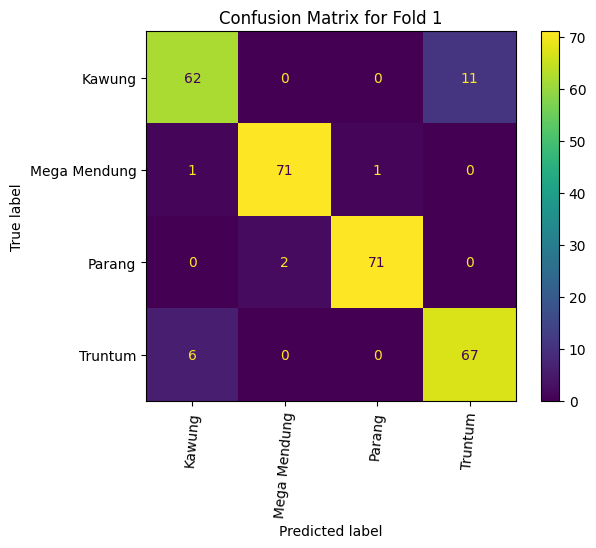

Classification Report
              precision    recall  f1-score   support

      Kawung     0.8986    0.8493    0.8732        73
Mega Mendung     0.9726    0.9726    0.9726        73
      Parang     0.9861    0.9726    0.9793        73
     Truntum     0.8590    0.9178    0.8874        73

    accuracy                         0.9281       292
   macro avg     0.9291    0.9281    0.9281       292
weighted avg     0.9291    0.9281    0.9281       292




Kfold 2 ...
10/10 ━━━━━━━━━━━━━━━━━━━━ 31s 3s/step


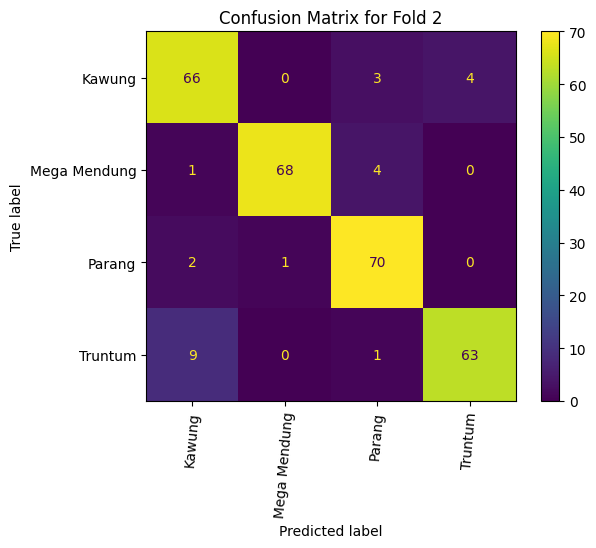

Classification Report
              precision    recall  f1-score   support

      Kawung     0.8462    0.9041    0.8742        73
Mega Mendung     0.9855    0.9315    0.9577        73
      Parang     0.8974    0.9589    0.9272        73
     Truntum     0.9403    0.8630    0.9000        73

    accuracy                         0.9144       292
   macro avg     0.9173    0.9144    0.9148       292
weighted avg     0.9173    0.9144    0.9148       292




Kfold 3 ...
10/10 ━━━━━━━━━━━━━━━━━━━━ 34s 3s/step


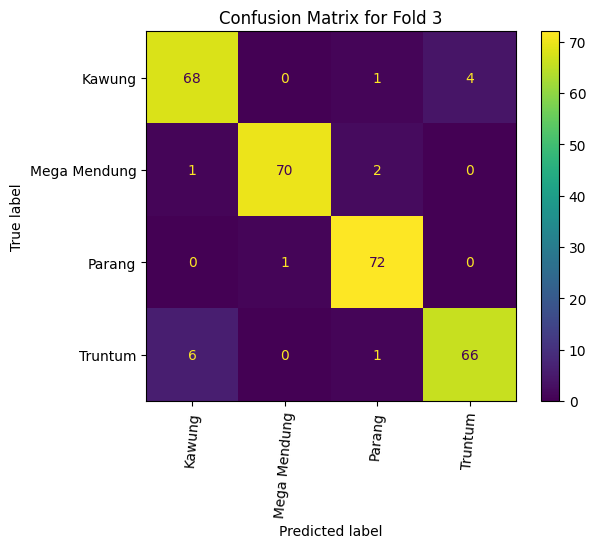

Classification Report
              precision    recall  f1-score   support

      Kawung     0.9067    0.9315    0.9189        73
Mega Mendung     0.9859    0.9589    0.9722        73
      Parang     0.9474    0.9863    0.9664        73
     Truntum     0.9429    0.9041    0.9231        73

    accuracy                         0.9452       292
   macro avg     0.9457    0.9452    0.9452       292
weighted avg     0.9457    0.9452    0.9452       292




Kfold 4 ...
10/10 ━━━━━━━━━━━━━━━━━━━━ 36s 3s/step


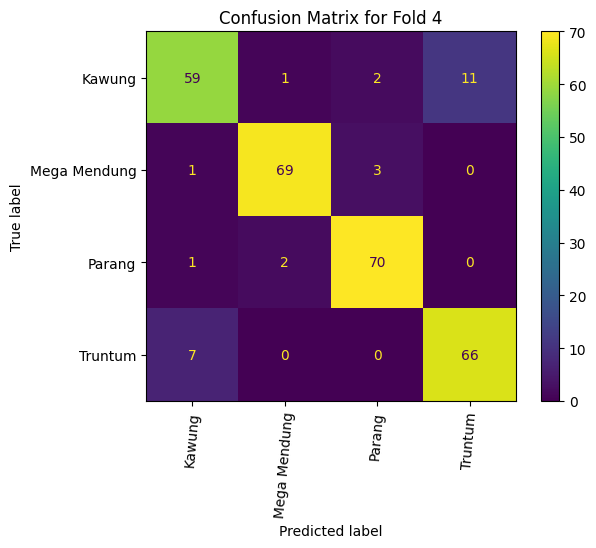

Classification Report
              precision    recall  f1-score   support

      Kawung     0.8676    0.8082    0.8369        73
Mega Mendung     0.9583    0.9452    0.9517        73
      Parang     0.9333    0.9589    0.9459        73
     Truntum     0.8571    0.9041    0.8800        73

    accuracy                         0.9041       292
   macro avg     0.9041    0.9041    0.9036       292
weighted avg     0.9041    0.9041    0.9036       292




Kfold 5 ...
10/10 ━━━━━━━━━━━━━━━━━━━━ 31s 3s/step


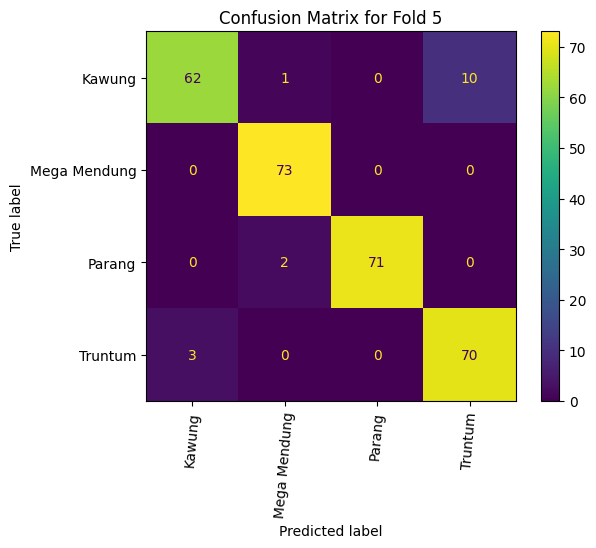

Classification Report
              precision    recall  f1-score   support

      Kawung     0.9538    0.8493    0.8986        73
Mega Mendung     0.9605    1.0000    0.9799        73
      Parang     1.0000    0.9726    0.9861        73
     Truntum     0.8750    0.9589    0.9150        73

    accuracy                         0.9452       292
   macro avg     0.9473    0.9452    0.9449       292
weighted avg     0.9473    0.9452    0.9449       292



In [6]:
from tensorflow.keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
    )

test_generator = datagen.flow_from_directory(
    directory=test_dir,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    color_mode='rgb',
    shuffle=False
)

def evaluate_model(fold_count, test_generator, model_path='./model P1/best_model_'):
    for fold in range(1, fold_count + 1):
        print('\n\n')
        print(f"Kfold {fold} ...")
        loaded_model = load_model(f'{model_path}{fold}.keras')
        
        predictions = loaded_model.predict(test_generator)
        
        # Get class labels
        class_labels = list(test_generator.class_indices.keys())
        
        # Get the true and predicted class indices
        y_true = test_generator.classes
        y_pred = np.argmax(predictions, axis=1)
        
        # Confusion Matrix Display
        conf_matrix = confusion_matrix(y_true, y_pred)
        disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=class_labels)
        
        disp.plot(cmap='viridis')
        plt.title(f'Confusion Matrix for Fold {fold}')
        plt.xticks(rotation=85)
        plt.show()
        
        class_report = classification_report(y_true, y_pred, target_names=class_labels, digits=4)
        print('Classification Report')
        print(class_report)

evaluate_model(fold_count=5, test_generator=test_generator)




Evaluasi KFold 1 ...
10/10 ━━━━━━━━━━━━━━━━━━━━ 30s 3s/step
Skor AUC (macro-average) untuk Fold 1: 0.9918


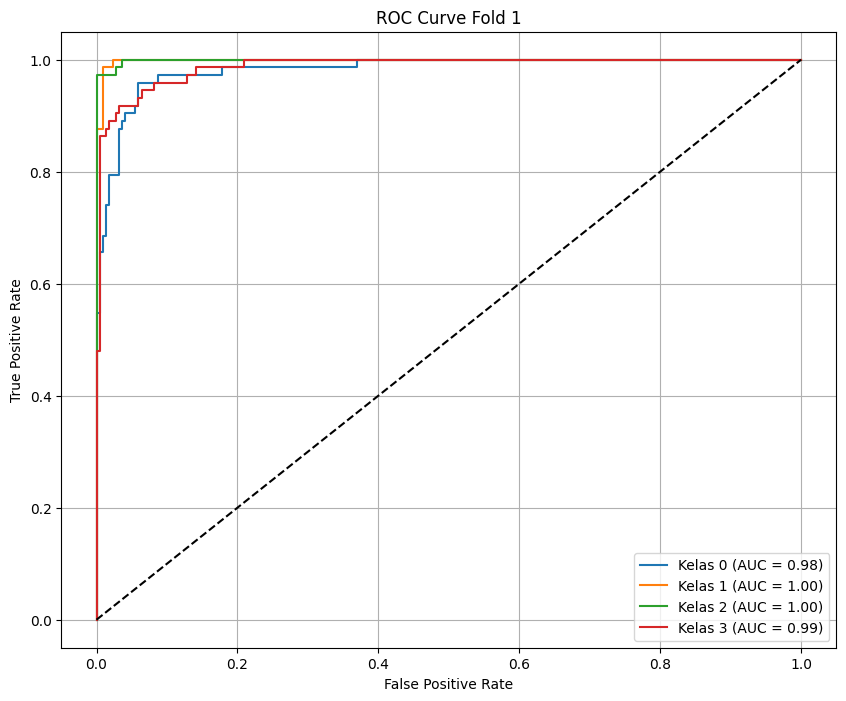




Evaluasi KFold 2 ...
10/10 ━━━━━━━━━━━━━━━━━━━━ 30s 3s/step
Skor AUC (macro-average) untuk Fold 2: 0.9880


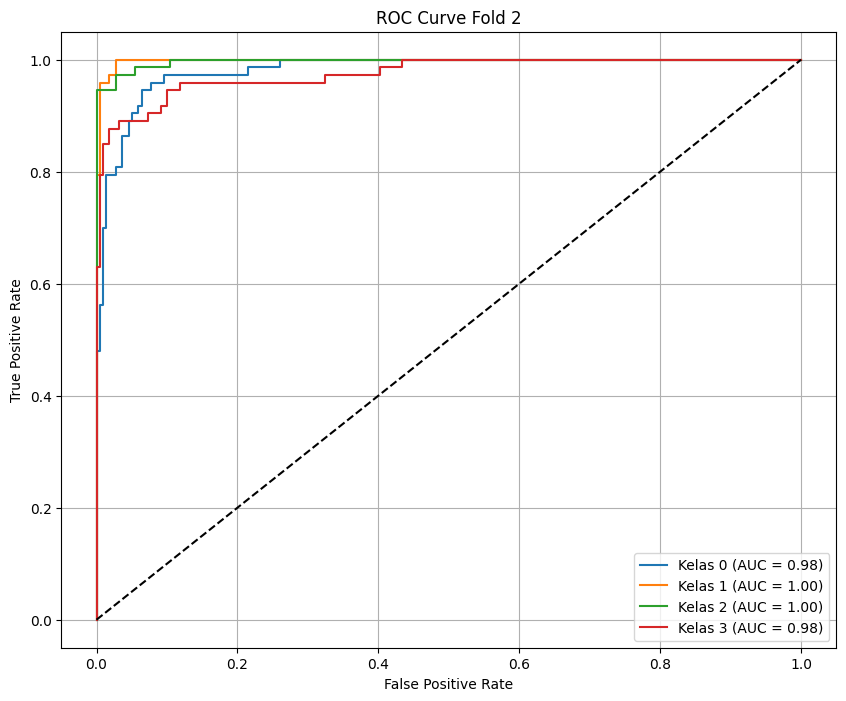




Evaluasi KFold 3 ...
10/10 ━━━━━━━━━━━━━━━━━━━━ 30s 3s/step
Skor AUC (macro-average) untuk Fold 3: 0.9912


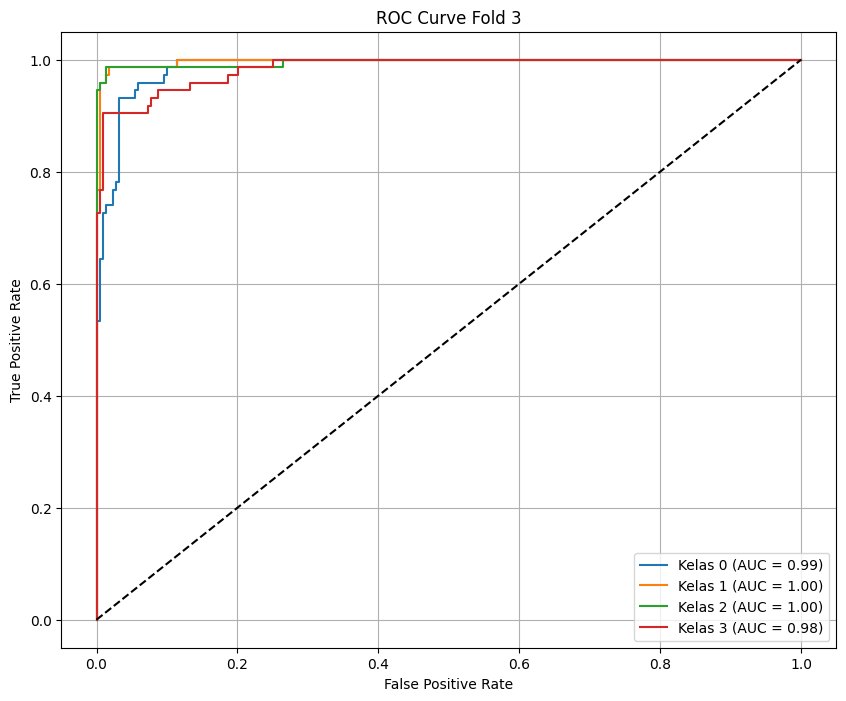




Evaluasi KFold 4 ...
10/10 ━━━━━━━━━━━━━━━━━━━━ 31s 3s/step
Skor AUC (macro-average) untuk Fold 4: 0.9895


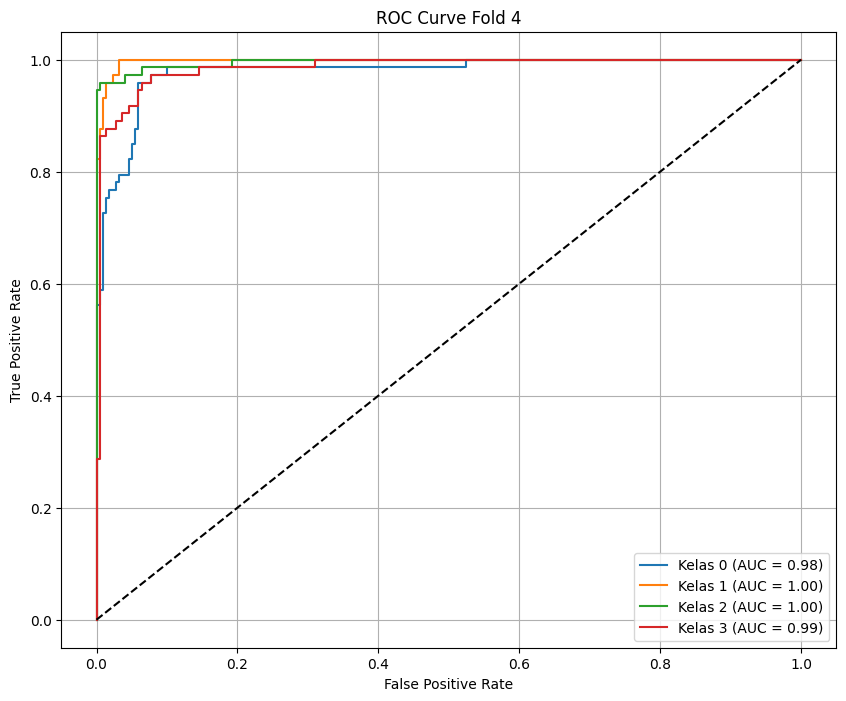




Evaluasi KFold 5 ...
10/10 ━━━━━━━━━━━━━━━━━━━━ 31s 3s/step
Skor AUC (macro-average) untuk Fold 5: 0.9930


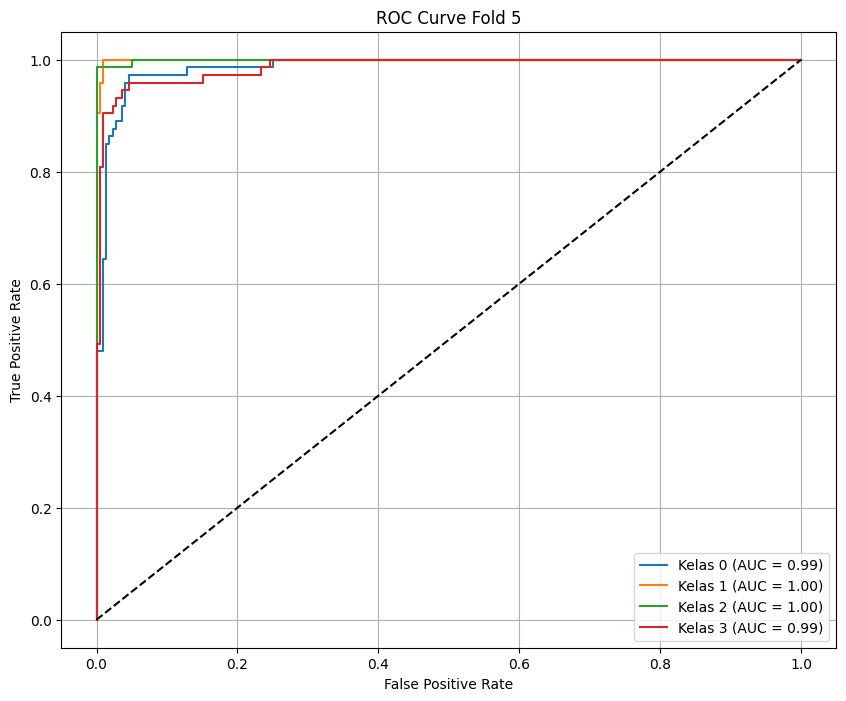

In [12]:
from sklearn.metrics import roc_auc_score, roc_curve, auc
from sklearn.preprocessing import label_binarize

def evaluate_model(fold_count, test_generator, model_path='./model P1/best_model_'):
    for fold in range(1, fold_count + 1):
        print('\n\n')
        print(f"Evaluasi KFold {fold} ...")
        
        # Load model
        loaded_model = load_model(f'{model_path}{fold}.keras')

        # Prediksi pada data testing
        predictions = loaded_model.predict(test_generator)

        # Ambil label sebenarnya dari generator
        true_labels = test_generator.classes
        
        # Konversi label ke bentuk one-hot
        num_classes = predictions.shape[1]
        y_true = label_binarize(true_labels, classes=range(num_classes))
        
        # Hitung skor AUC macro
        auc_score = roc_auc_score(y_true, predictions, average='macro', multi_class='ovr')
        print(f"Skor AUC (macro-average) untuk Fold {fold}: {auc_score:.4f}")

        # Plot ROC Curve untuk setiap kelas
        fpr = dict()
        tpr = dict()
        roc_auc = dict()

        for i in range(num_classes):
            fpr[i], tpr[i], _ = roc_curve(y_true[:, i], predictions[:, i])
            roc_auc[i] = auc(fpr[i], tpr[i])

        # Plot semua ROC dalam 1 grafik
        plt.figure(figsize=(10, 8))
        for i in range(num_classes):
            plt.plot(fpr[i], tpr[i], label=f'Kelas {i} (AUC = {roc_auc[i]:.2f})')

        plt.plot([0, 1], [0, 1], 'k--')  # Garis diagonal random guess
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'ROC Curve Fold {fold}')
        plt.legend(loc='lower right')
        plt.grid(True)
        plt.show()

evaluate_model(fold_count=5, test_generator=test_generator)

# Vertikal Flip

In [7]:

def data_generator(file_paths, labels, batch_size, augment=True):
    datagen = ImageDataGenerator(
        # preprocessing_function=preprocess_image,
        vertical_flip=True,
    ) if augment else ImageDataGenerator(preprocessing_function=preprocess_image)

    while True:
        indices = np.arange(len(file_paths))
        np.random.shuffle(indices)
        
        for i in range(0, len(file_paths), batch_size):
            batch_indices = indices[i:i + batch_size]
            batch_images = []
            batch_labels = []

            for idx in batch_indices:
                img = load_img(file_paths[idx], target_size=(IMAGE_HEIGHT, IMAGE_WIDTH))
                img = img_to_array(img)
                img = preprocess_image(img)
                batch_images.append(img)
                batch_labels.append(labels[idx])

            batch_images = np.array(batch_images)
            batch_labels = to_categorical(np.array(batch_labels), num_classes=len(unique_labels))

            # yield batch_images, batch_labels  # Langsung return data batch
            yield next(datagen.flow(batch_images, batch_labels, batch_size=batch_size))

def combined_generator(original_generator, augmented_generator):
    while True:
        original_batch = next(original_generator)
        augmented_batch = next(augmented_generator)
        combined_data = np.concatenate([original_batch[0], augmented_batch[0]], axis=0)
        combined_labels = np.concatenate([original_batch[1], augmented_batch[1]], axis=0)
        yield combined_data, combined_labels

# # Split dataset: 80% training, 20% validation
# train_files, val_files, train_labels, val_labels = train_test_split(
#     file_paths, integer_labels, test_size=0.2, random_state=42, stratify=integer_labels
# )

# original_train_generator = data_generator(train_files, train_labels, BATCH_SIZE, augment=False)
# augmented_train_generator = data_generator(train_files, train_labels, BATCH_SIZE, augment=True)
# combined_train_generator = combined_generator(original_train_generator, augmented_train_generator)

# val_generator = data_generator(val_files, val_labels, BATCH_SIZE, augment=False)

# # Hitung jumlah data
# num_original_train = len(train_files) # Jumlah data asli
# num_augmented_train = num_original_train * 2 # Augmented dianggap
# # sebagai dua kali lipat data asli
# num_validation = len(val_files) # Jumlah data validasi

# print(f"Jumlah data training asli (original): {num_original_train}")
# print(f"Jumlah data training dengan augmentasi: {num_augmented_train}")
# print(f"Jumlah data validasi: {num_validation}\n")


In [8]:
labels = os.listdir(train_dir)
label_map = {label: idx for idx, label in enumerate(labels)}
print(label_map)

{'Kawung': 0, 'Mega Mendung': 1, 'Parang': 2, 'Truntum': 3}


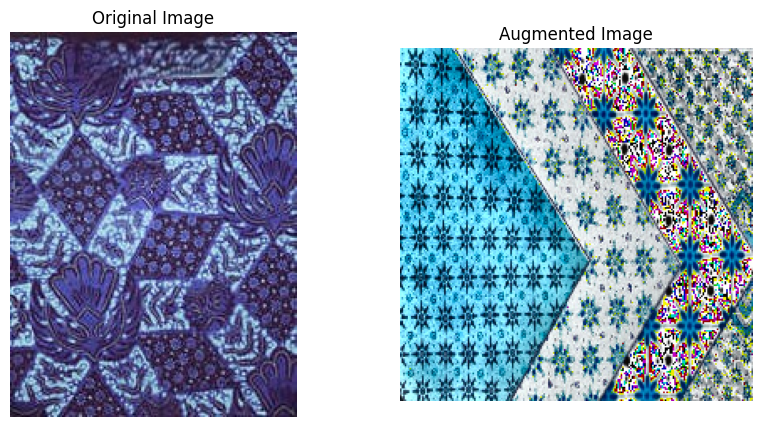

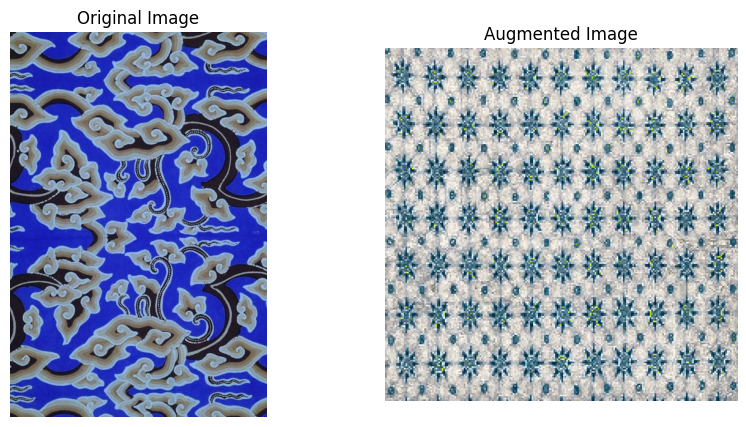

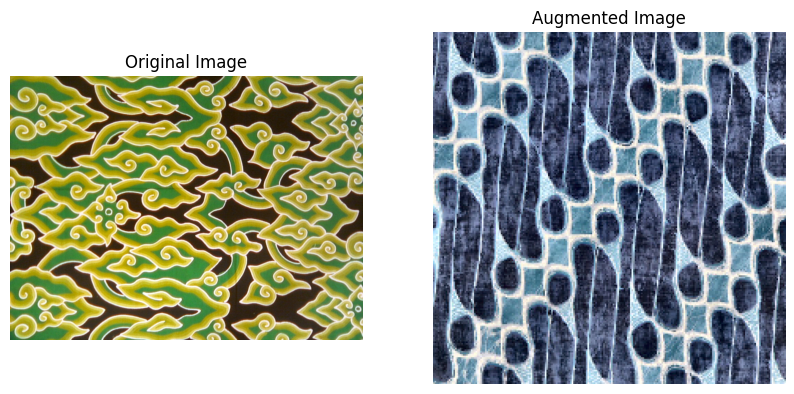

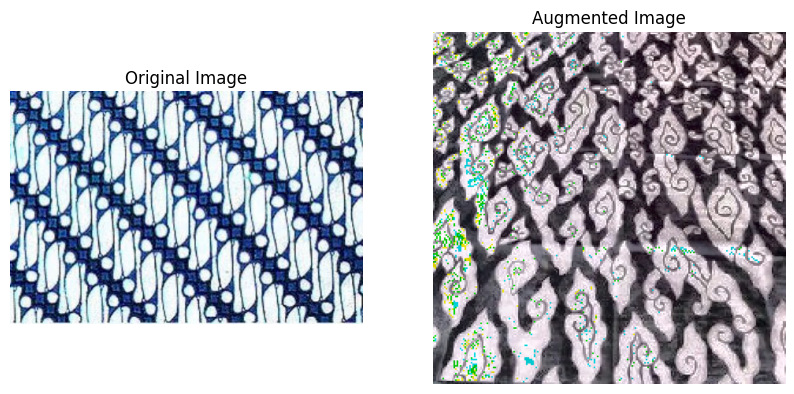

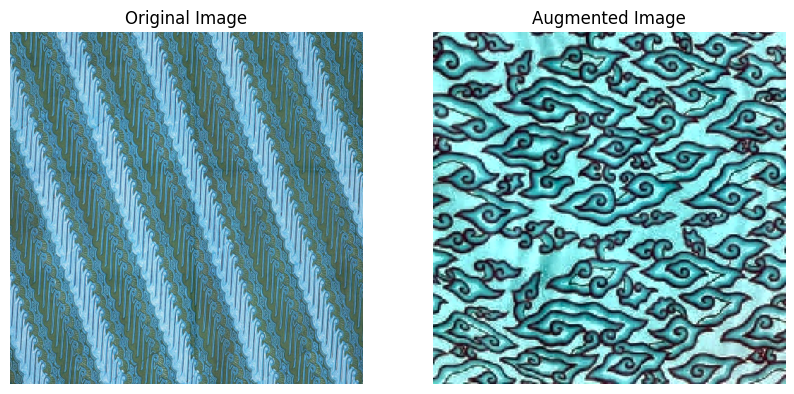

In [14]:
# Ambil satu batch gambar dari generator
images, labels = next(augmented_train_generator)  

# Pastikan kita memiliki daftar file paths asli (train_files)
if len(train_files) < len(images):
    print("Peringatan: Jumlah file_paths lebih kecil dari batch size. Pastikan pembagian data sudah benar.")

for i in range(5):
    # Ambil path gambar asli dari daftar file_paths manual
    img_path = train_files[i]  # Ambil path asli sebelum augmentasi

    # Load original image dari file path
    original_image = cv2.imread(img_path)

    augmented_image = images[i]

    # # Ambil gambar yang sudah diaugmentasi dari batch generator
    # augmented_image = images[i].astype(np.uint8)  # Pastikan format uint8 agar bisa ditampilkan dengan benar
    # Convert images to uint8 for proper display
    augmented_image = preprocess_image(augmented_image)
    augmented_image = cv2.resize(augmented_image, IMAGE_SIZE)

    # Tampilkan gambar asli & augmentasi berdampingan
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(original_image)
    axes[0].set_title(f"Original Image")
    axes[0].axis("off")

    axes[1].imshow(augmented_image)
    axes[1].set_title(f"Augmented Image")
    axes[1].axis("off")

    plt.show()

Training fold ke-1
Jumlah data training asli (original): 934
Jumlah data training dengan augmentasi: 1868
Jumlah data validasi: 234

Epoch 1/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 339s 5s/step - accuracy: 0.5432 - loss: 1.0992 - val_accuracy: 0.9196 - val_loss: 0.3282 - learning_rate: 1.0000e-04
Epoch 2/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 253s 4s/step - accuracy: 0.8257 - loss: 0.4434 - val_accuracy: 0.9420 - val_loss: 0.2390 - learning_rate: 1.0000e-04
Epoch 3/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 291s 5s/step - accuracy: 0.9070 - loss: 0.2663 - val_accuracy: 0.9505 - val_loss: 0.1623 - learning_rate: 1.0000e-04
Epoch 4/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 282s 5s/step - accuracy: 0.9537 - loss: 0.1422 - val_accuracy: 0.9604 - val_loss: 0.1423 - learning_rate: 1.0000e-04
Epoch 5/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 241s 4s/step - accuracy: 0.9760 - loss: 0.0835 - val_accuracy: 0.9688 - val_loss: 0.1274 - learning_rate: 1.0000e-04
Epoch 6/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 233s 4s/step - accuracy: 0.9750 - loss: 0.0714 - val_a

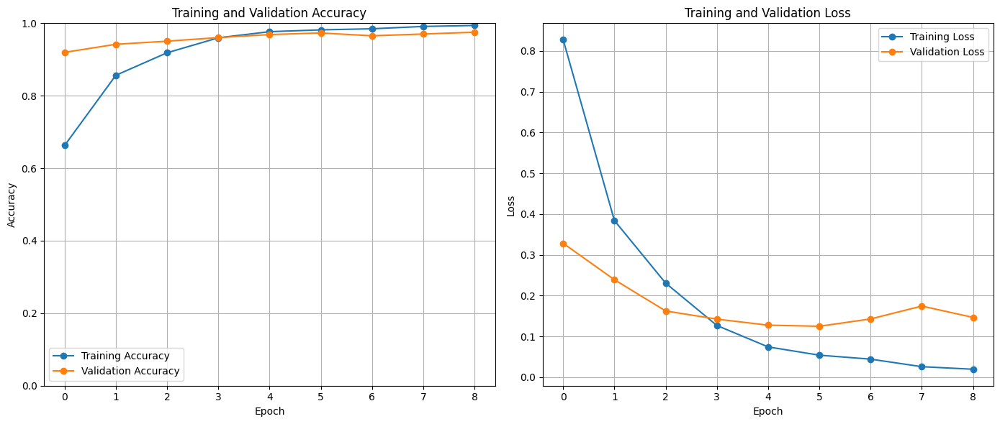

Training fold ke-2
Jumlah data training asli (original): 934
Jumlah data training dengan augmentasi: 1868
Jumlah data validasi: 234

Epoch 1/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 226s 4s/step - accuracy: 0.5396 - loss: 1.1852 - val_accuracy: 0.9152 - val_loss: 0.3378 - learning_rate: 1.0000e-04
Epoch 2/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 243s 4s/step - accuracy: 0.8570 - loss: 0.4055 - val_accuracy: 0.9196 - val_loss: 0.2089 - learning_rate: 1.0000e-04
Epoch 3/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 238s 4s/step - accuracy: 0.9431 - loss: 0.1709 - val_accuracy: 0.9554 - val_loss: 0.1044 - learning_rate: 1.0000e-04
Epoch 4/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 236s 4s/step - accuracy: 0.9662 - loss: 0.1118 - val_accuracy: 0.9307 - val_loss: 0.2373 - learning_rate: 1.0000e-04
Epoch 5/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9795 - loss: 0.0619
Epoch 5: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.
58/58 ━━━━━━━━━━━━━━━━━━━━ 243s 4s/step - accuracy: 0.9795 - loss: 0.0618 - val_accuracy

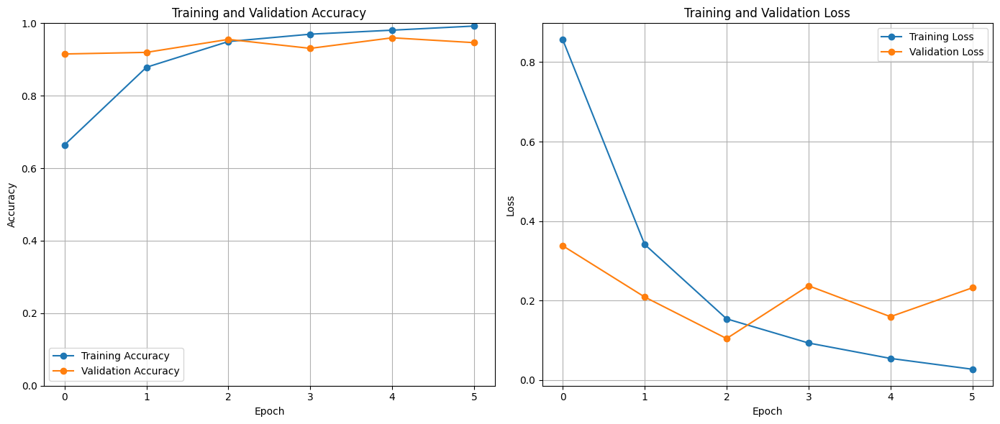

Training fold ke-3
Jumlah data training asli (original): 934
Jumlah data training dengan augmentasi: 1868
Jumlah data validasi: 234

Epoch 1/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 259s 4s/step - accuracy: 0.5647 - loss: 1.0686 - val_accuracy: 0.9286 - val_loss: 0.2744 - learning_rate: 1.0000e-04
Epoch 2/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 262s 5s/step - accuracy: 0.8441 - loss: 0.4242 - val_accuracy: 0.9732 - val_loss: 0.1198 - learning_rate: 1.0000e-04
Epoch 3/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 262s 5s/step - accuracy: 0.9129 - loss: 0.2512 - val_accuracy: 0.9653 - val_loss: 0.0906 - learning_rate: 1.0000e-04
Epoch 4/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 263s 5s/step - accuracy: 0.9529 - loss: 0.1342 - val_accuracy: 0.9851 - val_loss: 0.0641 - learning_rate: 1.0000e-04
Epoch 5/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 256s 4s/step - accuracy: 0.9711 - loss: 0.0935 - val_accuracy: 0.9777 - val_loss: 0.0712 - learning_rate: 1.0000e-04
Epoch 6/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 240s 4s/step - accuracy: 0.9821 - loss: 0.0563 - val_a

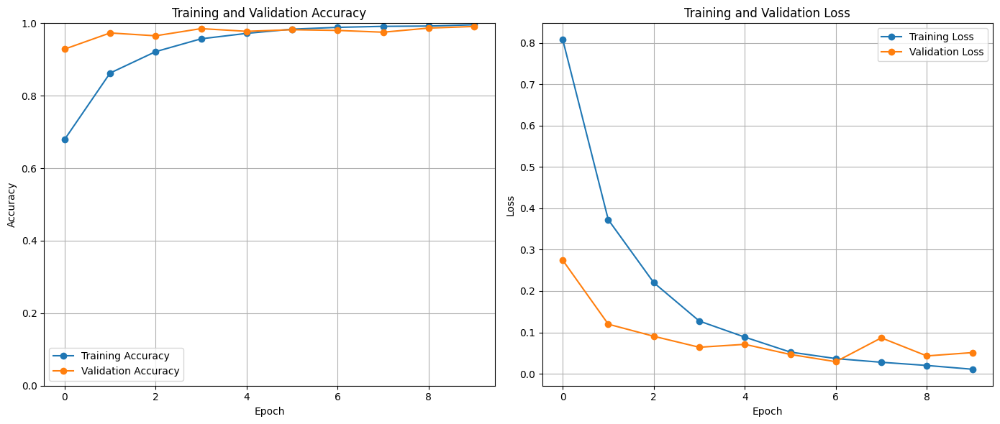

Training fold ke-4
Jumlah data training asli (original): 935
Jumlah data training dengan augmentasi: 1870
Jumlah data validasi: 233

Epoch 1/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 273s 4s/step - accuracy: 0.4325 - loss: 1.3271 - val_accuracy: 0.7991 - val_loss: 0.5598 - learning_rate: 1.0000e-04
Epoch 2/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 255s 4s/step - accuracy: 0.7052 - loss: 0.6832 - val_accuracy: 0.8839 - val_loss: 0.4176 - learning_rate: 1.0000e-04
Epoch 3/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 268s 5s/step - accuracy: 0.8065 - loss: 0.4769 - val_accuracy: 0.9602 - val_loss: 0.2919 - learning_rate: 1.0000e-04
Epoch 4/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 251s 4s/step - accuracy: 0.9052 - loss: 0.2664 - val_accuracy: 0.9502 - val_loss: 0.1920 - learning_rate: 1.0000e-04
Epoch 5/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 226s 4s/step - accuracy: 0.9463 - loss: 0.1618 - val_accuracy: 0.9464 - val_loss: 0.2653 - learning_rate: 1.0000e-04
Epoch 6/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9800 - loss: 0.0667
Epoch 6: 

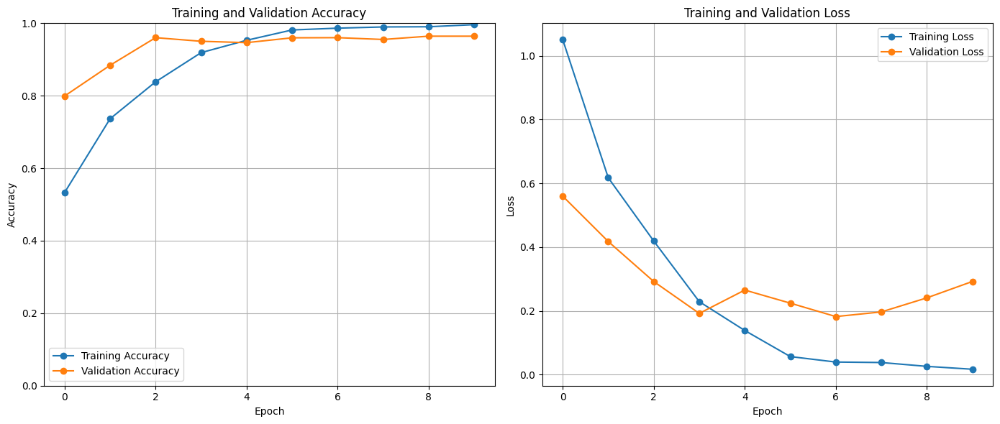

Training fold ke-5
Jumlah data training asli (original): 935
Jumlah data training dengan augmentasi: 1870
Jumlah data validasi: 233

Epoch 1/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 233s 4s/step - accuracy: 0.5043 - loss: 1.2007 - val_accuracy: 0.8973 - val_loss: 0.3707 - learning_rate: 1.0000e-04
Epoch 2/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 209s 4s/step - accuracy: 0.8136 - loss: 0.5041 - val_accuracy: 0.9241 - val_loss: 0.2547 - learning_rate: 1.0000e-04
Epoch 3/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 203s 4s/step - accuracy: 0.8869 - loss: 0.2925 - val_accuracy: 0.9453 - val_loss: 0.1987 - learning_rate: 1.0000e-04
Epoch 4/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 207s 4s/step - accuracy: 0.9502 - loss: 0.1514 - val_accuracy: 0.9453 - val_loss: 0.1652 - learning_rate: 1.0000e-04
Epoch 5/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 205s 4s/step - accuracy: 0.9629 - loss: 0.1058 - val_accuracy: 0.9330 - val_loss: 0.2505 - learning_rate: 1.0000e-04
Epoch 6/10
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9775 - loss: 0.0633
Epoch 6: 

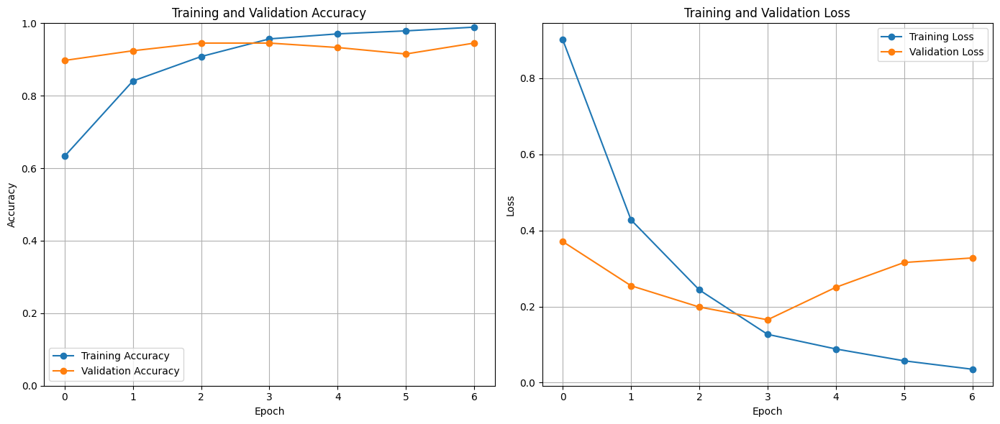

In [17]:
# Implementasi Kfold
n_splits = 5
EPOCH = 10

# Inisialisasi KFold
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42) # tambahkan random_state untuk reproduksibilitas

# Direktori untuk menyimpan model terbaik
best_model_dir = r'.\keras aug\vertikal flip' # Mendefinisikan best_model_dir di luar fungsi
# Fungsi untuk membuat model
def create_model(num_classes):
    base_model = DenseNet169(weights='imagenet', include_top=False, input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, 3))
    base_model.trainable = True
    for layer in base_model.layers[:-10]:  # Membekukan semua kecuali 10 lapisan terakhir
        layer.trainable = False

    x = base_model.output
    x = Conv2D(32, (4, 4), activation='relu')(x)
    x = MaxPooling2D((2, 2))(x)
    x = Dropout(0.3)(x)
    x = Dense(64, activation='relu', name='FC2')(x) 
    x = Dropout(0.3)(x)
    x = Flatten()(x)
    x = Dropout(0.3)(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer=RMSprop(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])
    
    # model.summary()
    return model

fold_var = 1 # Inisialisasi variabel fold
for train_idx, val_idx in kf.split(file_paths):
    print(f"Training fold ke-{fold_var}")

    # Membagi data training dan validation untuk fold ini
    train_files = [file_paths[i] for i in train_idx]
    train_labels = [integer_labels[i] for i in train_idx]
    val_files = [file_paths[i] for i in val_idx]
    val_labels = [integer_labels[i] for i in val_idx]

    original_train_generator = data_generator(train_files, train_labels, BATCH_SIZE, augment=False)
    augmented_train_generator = data_generator(train_files, train_labels, BATCH_SIZE, augment=True)
    combined_train_generator = combined_generator(original_train_generator, augmented_train_generator)

    val_generator = data_generator(val_files, val_labels, BATCH_SIZE, augment=False)
    
    # Hitung jumlah data
    num_original_train = len(train_files) # Jumlah data asli
    num_augmented_train = num_original_train * 2 # Augmented dianggap
    # sebagai dua kali lipat data asli
    num_validation = len(val_files) # Jumlah data validasi

    print(f"Jumlah data training asli (original): {num_original_train}")
    print(f"Jumlah data training dengan augmentasi: {num_augmented_train}")
    print(f"Jumlah data validasi: {num_validation}\n")

    # Callbacks
    early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1) # Hentikan training jika val_loss tidak membaik selama 3 epoch
    model_checkpoint = ModelCheckpoint(os.path.join(best_model_dir, f'flip_model_{fold_var}.keras'), monitor='val_accuracy', save_best_only=True)
    # Buat Learning Rate Scheduler
    lr_scheduler = ReduceLROnPlateau(
        monitor='val_loss',  # Memonitor val_loss untuk menurunkan LR
        factor=0.5,          # Learning rate akan dikalikan 0.5 jika tidak ada perbaikan
        patience=2,          # Jika val_loss tidak membaik setelah 2 epoch, LR akan diturunkan
        min_lr=1e-6,         # Learning rate minimum
        verbose=1            # Menampilkan log saat LR diturunkan
    )

    num_classes = len(labels) # atau bagaimanapun Anda menentukan jumlah kelas
    model = create_model(num_classes) # Panggil fungsi create_model dengan jumlah kelas yang benar

    # Training Model
    history = model.fit(
        combined_train_generator,
        steps_per_epoch=(2 * len(train_files)) // BATCH_SIZE, # Karena data asli + augmented
        epochs=EPOCH,
        validation_data=val_generator,
        validation_steps=len(val_files) // BATCH_SIZE,
        callbacks=[early_stopping, model_checkpoint, lr_scheduler]
    )

    # Plot grafik akurasi dan loss dengan format yang lebih baik
    plt.figure(figsize=(14, 6))

    # Plot Training and Validation Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Training Accuracy', marker='o')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.ylim(0, 1)  # Menentukan rentang y antara 0 dan 1 (untuk akurasi)
    plt.grid(True)
    plt.legend()

    # Plot Training and Validation Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Training Loss', marker='o')
    plt.plot(history.history['val_loss'], label='Validation Loss', marker='o')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.grid(True)
    plt.legend()

    # Tampilkan grafik
    plt.tight_layout()
    plt.show()

    # menambah fold
    fold_var += 1

In [9]:
test_generator = ImageDataGenerator(preprocessing_function=preprocess_image).flow_from_directory(
    directory=test_dir,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

Found 276 images belonging to 4 classes.





Kfold 1 ...


c:\Users\ASUS\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


9/9 ━━━━━━━━━━━━━━━━━━━━ 27s 2s/step


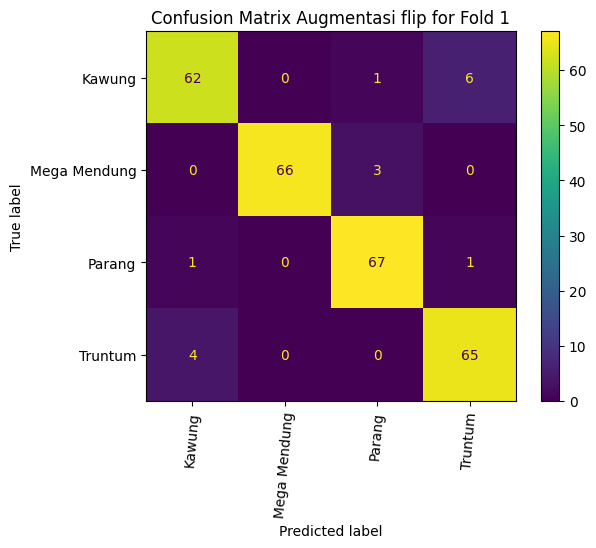

Classification Report
              precision    recall  f1-score   support

      Kawung     0.9254    0.8986    0.9118        69
Mega Mendung     1.0000    0.9565    0.9778        69
      Parang     0.9437    0.9710    0.9571        69
     Truntum     0.9028    0.9420    0.9220        69

    accuracy                         0.9420       276
   macro avg     0.9430    0.9420    0.9422       276
weighted avg     0.9430    0.9420    0.9422       276




Kfold 2 ...
9/9 ━━━━━━━━━━━━━━━━━━━━ 29s 3s/step


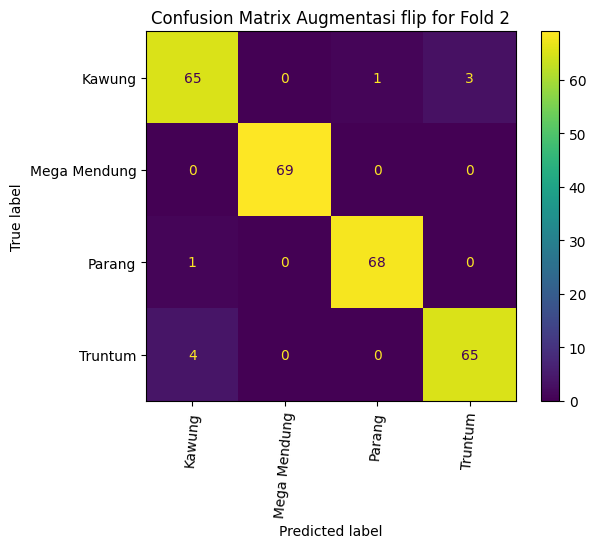

Classification Report
              precision    recall  f1-score   support

      Kawung     0.9286    0.9420    0.9353        69
Mega Mendung     1.0000    1.0000    1.0000        69
      Parang     0.9855    0.9855    0.9855        69
     Truntum     0.9559    0.9420    0.9489        69

    accuracy                         0.9674       276
   macro avg     0.9675    0.9674    0.9674       276
weighted avg     0.9675    0.9674    0.9674       276




Kfold 3 ...
9/9 ━━━━━━━━━━━━━━━━━━━━ 27s 2s/step


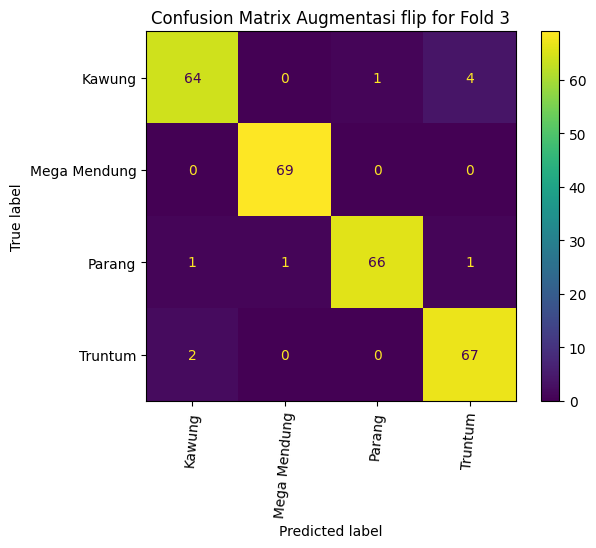

Classification Report
              precision    recall  f1-score   support

      Kawung     0.9552    0.9275    0.9412        69
Mega Mendung     0.9857    1.0000    0.9928        69
      Parang     0.9851    0.9565    0.9706        69
     Truntum     0.9306    0.9710    0.9504        69

    accuracy                         0.9638       276
   macro avg     0.9641    0.9638    0.9637       276
weighted avg     0.9641    0.9638    0.9637       276




Kfold 4 ...
9/9 ━━━━━━━━━━━━━━━━━━━━ 29s 3s/step


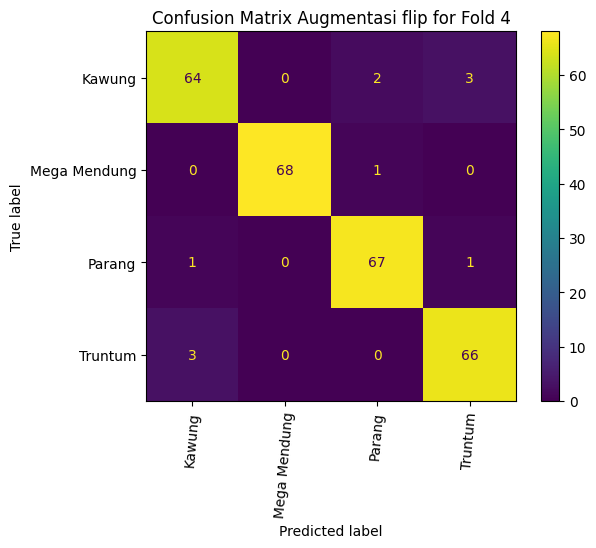

Classification Report
              precision    recall  f1-score   support

      Kawung     0.9412    0.9275    0.9343        69
Mega Mendung     1.0000    0.9855    0.9927        69
      Parang     0.9571    0.9710    0.9640        69
     Truntum     0.9429    0.9565    0.9496        69

    accuracy                         0.9601       276
   macro avg     0.9603    0.9601    0.9602       276
weighted avg     0.9603    0.9601    0.9602       276




Kfold 5 ...
9/9 ━━━━━━━━━━━━━━━━━━━━ 31s 3s/step


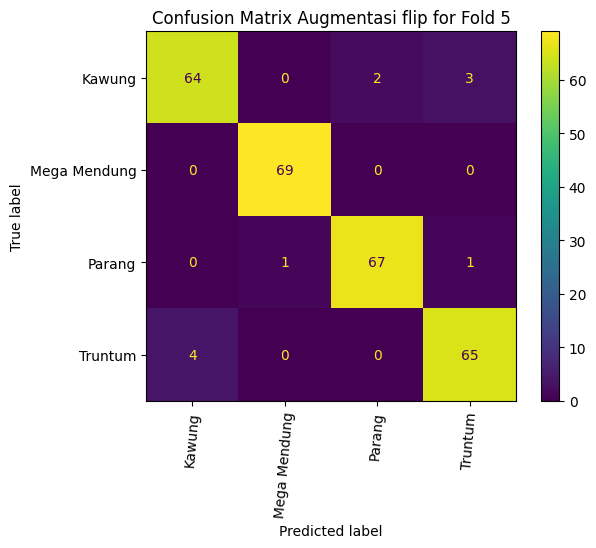

Classification Report
              precision    recall  f1-score   support

      Kawung     0.9412    0.9275    0.9343        69
Mega Mendung     0.9857    1.0000    0.9928        69
      Parang     0.9710    0.9710    0.9710        69
     Truntum     0.9420    0.9420    0.9420        69

    accuracy                         0.9601       276
   macro avg     0.9600    0.9601    0.9600       276
weighted avg     0.9600    0.9601    0.9600       276



In [10]:
def evaluate_model(fold_count, test_generator, model_path='./keras aug/vertikal flip/flip_model_'):
    for fold in range(1, fold_count + 1):
        print('\n\n')
        print(f"Kfold {fold} ...")
        loaded_model = load_model(f'{model_path}{fold}.keras')
        
        predictions = loaded_model.predict(test_generator)
        
        # Get class labels
        class_labels = list(test_generator.class_indices.keys())
        
        # Get the true and predicted class indices
        y_true = test_generator.classes
        y_pred = np.argmax(predictions, axis=1)
        
        # Confusion Matrix Display
        conf_matrix = confusion_matrix(y_true, y_pred)
        disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=class_labels)
        
        disp.plot(cmap='viridis')
        plt.title(f'Confusion Matrix Augmentasi flip for Fold {fold}')
        plt.xticks(rotation=85)
        plt.show()
        
        class_report = classification_report(y_true, y_pred, target_names=class_labels, digits=4)
        print('Classification Report')
        print(class_report)

evaluate_model(fold_count=5, test_generator=test_generator)

## Manual true false

In [ ]:
# val_generator = data_generator(val_files, val_labels, BATCH_SIZE, augment=False)

model = load_model('./keras aug/vertikal flip/flip_model_3.keras')

# Get total samples in validation set
num_samples = val_generator.samples

# Initialize empty lists to store images, true labels, and predictions
all_images = []
all_true_labels = []
all_pred_labels = []

# Iterate through the entire validation set
for i in range(len(test_generator)):  # Loop through all batches
    val_images, val_labels = next(val_generator)  # Get batch
    predictions = model.predict(val_images)  # Get predictions

    all_images.extend(val_images)  # Store images
    all_true_labels.extend(np.argmax(val_labels, axis=1))  # Store true labels
    all_pred_labels.extend(np.argmax(predictions, axis=1))  # Store predicted labels

# Convert lists to numpy arrays
all_images = np.array(all_images)
all_true_labels = np.array(all_true_labels)
all_pred_labels = np.array(all_pred_labels)

# Plot all images with true & predicted labels
fig, axes = plt.subplots(len(all_images) // 10 + 1, 10, figsize=(20, len(all_images) // 2))

for i, ax in enumerate(axes.flat):
    if i >= len(all_images):  
        ax.axis('off')  # Hide empty plots
        continue  

    ax.imshow(all_images[i])  # Show the image
    true_label = labels[all_true_labels[i]]  # Get true class name
    pred_label = labels[all_pred_labels[i]]  # Get predicted class name

    # Display true & predicted labels
    ax.set_title(f"True: {true_label}\nPred: {pred_label}", fontsize=10,
                 color="green" if true_label == pred_label else "red")

    ax.axis('off')

plt.tight_layout()
plt.show()

AttributeError: 'generator' object has no attribute 'samples'